# Preprocessing

In [1]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import celloracle as co
import anndata as ad
import seaborn as sns

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

## Load Data

In [20]:
# Download dataset. You can change the code blow to use your data.
adata = co.data_conversion.seurat_object_to_anndata("jinlab/ctxobj.rds",
                                                    delete_tmp_file=True)

input file name: jinlab/ctxobj.rds


Loading required package: SeuratObject
Loading required package: sp

Attaching package: ‘SeuratObject’

The following objects are masked from ‘package:base’:

    intersect, t

loading seurat object ...
  seurat object version is 4x
Processing an assay: RNA
Processing an assay: Crispr


making AnnData ...
2 assays found in the seurat object.
Data is exported as multiple files.
If the seurat object was made by integrating multiple files, please be careful about 'Simpson's effect' in the inferred GRN.
Go to CellOracle web documentation for detailed information about this issue.


In [22]:
adata

AnnData object with n_obs × n_vars = 11471 × 32285
    obs: 'Name', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scds', 'cxds', 'bcds', 'RNA_snn_res.0.8', 'seurat_clusters', 'nCount_refAssay', 'nFeature_refAssay', 'predicted.subclass.score', 'predicted.subclass', 'feature_call', 'num_features', 'num_umis', 'nCount_Crispr', 'nFeature_Crispr', 'RNA_snn_res.1.5', 'lowQC', 'CellType', 'Perc', 'CBC', 'antisense', 'intergenic', 'intronic', 'exonic', 'multi', 'unmapped', 'highConf', 'polyA', 'TSO', 'spliced', 'percent_qual_cbc', 'percent_qual_umi', 'nUMI', 'UTR', 'total', 'Rem', 'CellType_Gen', 'Mito', 'demux_type', 'assignment', 'Keep', 'Max', 'MaxVal', 'SecMaxVal', 'demuxHC', 'demuxCR', 'demuxDS', 'assignDS', 'pertgene', 'active_ident'
    var: 'variable_gene'
    uns: 'RNA_snn_res.0.8_colors', 'seurat_clusters_colors', 'active_ident_colors'
    obsm: 'X_umap', 'X_pca', 'X_gbm'
    layers: 'raw_count'

In [21]:
raw_count_layer = adata['RNA'].layers['raw_count']
adata['RNA'].X = raw_count_layer
adata = adata['RNA']

## Filtering

In [9]:
# Only consider genes with more than 1 count
sc.pp.filter_genes(adata, min_counts=1)

## Normalization

In [10]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='nCount_RNA')

## Identification of Highly Variable Genes

In [11]:
# Select top 2000 highly-variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)

# Subset the genes
adata = adata[:, filter_result.gene_subset]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)

## Log Transformation

In [12]:
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()

# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

## PCA and Neighbor Calculations

In [16]:
# PCA
sc.tl.pca(adata, svd_solver='arpack')

# Diffusion map
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)

sc.tl.diffmap(adata)
# Calculate neihbors again based on diffusionmap 
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

## Cell Clustering

In [17]:
sc.tl.louvain(adata, resolution=0.8)

In [19]:
len(adata.obs['louvain'].unique())

30

In [20]:
adata.obs['louvain']

Ch1_AAACCTGTCAGGTTCA-1     4
Ch1_AAACCTGTCCTTTACA-1     1
Ch1_AAACGGGCACAGGAGT-1     6
Ch1_AAACGGGCATGCAATC-1     0
Ch1_AAACGGGGTAATAGCA-1    11
                          ..
Ch5_TTTGGTTGTTCACGGC-1     8
Ch5_TTTGGTTTCGAACGGA-1    10
Ch5_TTTGGTTTCTTTACGT-1     0
Ch5_TTTGTCAGTTGACGTT-1     6
Ch5_TTTGTCATCTACTTAC-1    21
Name: louvain, Length: 11471, dtype: category
Categories (30, object): ['0', '1', '2', '3', ..., '26', '27', '28', '29']

In [21]:
adata.obs['predicted.subclass']

Ch1_AAACCTGTCAGGTTCA-1    L5 IT TPE-ENT
Ch1_AAACCTGTCCTTTACA-1    L2/3 IT CTX-1
Ch1_AAACGGGCACAGGAGT-1               CR
Ch1_AAACGGGCATGCAATC-1        L5 NP CTX
Ch1_AAACGGGGTAATAGCA-1        L6 IT CTX
                              ...      
Ch5_TTTGGTTGTTCACGGC-1        L6 CT CTX
Ch5_TTTGGTTTCGAACGGA-1        L6 CT CTX
Ch5_TTTGGTTTCTTTACGT-1        L5 IT CTX
Ch5_TTTGTCAGTTGACGTT-1               CR
Ch5_TTTGTCATCTACTTAC-1      L4/5 IT CTX
Name: predicted.subclass, Length: 11471, dtype: object

In [22]:
adata.obs['seurat_clusters']

Ch1_AAACCTGTCAGGTTCA-1    6
Ch1_AAACCTGTCCTTTACA-1    4
Ch1_AAACGGGCACAGGAGT-1    1
Ch1_AAACGGGCATGCAATC-1    6
Ch1_AAACGGGGTAATAGCA-1    5
                         ..
Ch5_TTTGGTTGTTCACGGC-1    2
Ch5_TTTGGTTTCGAACGGA-1    0
Ch5_TTTGGTTTCTTTACGT-1    6
Ch5_TTTGTCAGTTGACGTT-1    1
Ch5_TTTGTCATCTACTTAC-1    4
Name: seurat_clusters, Length: 11471, dtype: object

## Dimensionality reduction using PAGA and force-directed graphs

In [24]:
# PAGA graph construction
sc.tl.paga(adata, groups='louvain')

... storing 'Name' as categorical
... storing 'orig.ident' as categorical
... storing 'predicted.subclass' as categorical
... storing 'feature_call' as categorical
... storing 'num_umis' as categorical
... storing 'CellType' as categorical
... storing 'CBC' as categorical
... storing 'CellType_Gen' as categorical
... storing 'demux_type' as categorical
... storing 'assignment' as categorical
... storing 'Max' as categorical
... storing 'demuxHC' as categorical
... storing 'demuxCR' as categorical
... storing 'demuxDS' as categorical
... storing 'assignDS' as categorical
... storing 'pertgene' as categorical


In [25]:
plt.rcParams["figure.figsize"] = [6, 4.5]

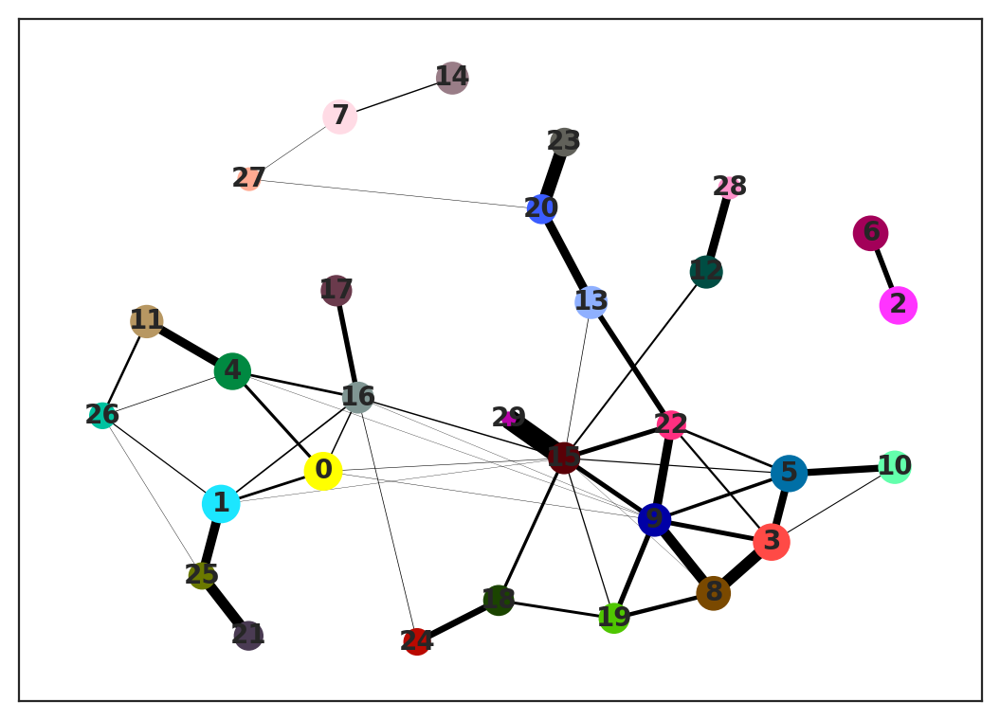

In [27]:
sc.pl.paga(adata)

In [28]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)

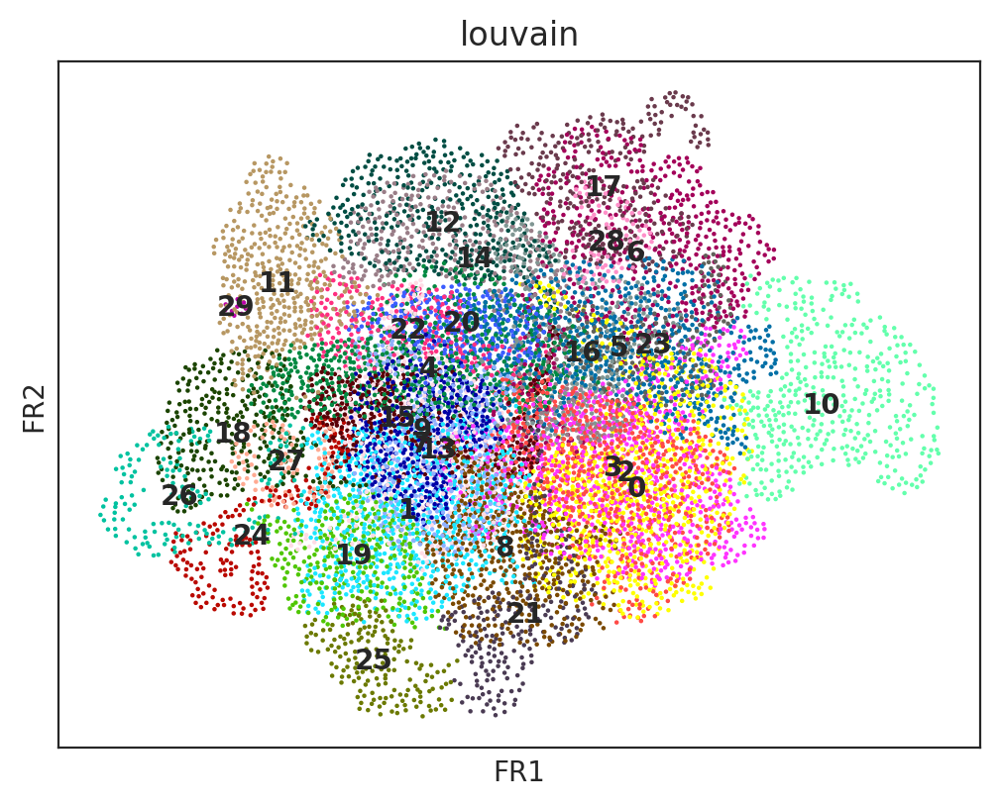

In [29]:
sc.pl.draw_graph(adata, color='louvain', legend_loc='on data')

In [33]:
#adata.write_h5ad("jinlab/ctxobj.h5ad")

## can't save due to "Can't implicitly convert non-string objects to strings\
## Error raised while writing key 'RNA_snn_res.0.8' of <class 'h5py._hl.group.Group'> to /obs"

In [35]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :11471
Gene number is :2000


## Load base GRN

In [36]:
# Load TF info which was made from mouse cell atlas dataset.
base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()

# Check data
base_GRN.head()

Data not found in the local folder. Loading data from github. Data will be saved at /gpfs/home/asun/celloracle_data/TFinfo_data


  0%|          | 0.00/9.01M [00:00<?, ?B/s]

,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100050979_100052296,4930430F08Rik,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101006922_101007748,SNORA17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,chr10_101144061_101145000,Mgat4c,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,chr10_10148873_10149183,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_10149425_10149815,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Make Oracle Object

In [16]:
# Instantiate Oracle object
oracle = co.Oracle()

## Load Gene Expression Data into Oracle

In [17]:
# Check data in anndata
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

NameError: name 'adata' is not defined

In [41]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="louvain",
                                   embedding_name="X_draw_graph_fr")

## Load base-GRN data into Oracle Object

In [4]:
# You can load TF info dataframe with the following code.
oracle.import_TF_data(TF_info_matrix=base_GRN)

# Alternatively, if you saved the informmation as a dictionary, you can use the code below.
# oracle.import_TF_data(TFdict=TFinfo_dictionary)

NameError: name 'oracle' is not defined

## KNN Imputation

In [ ]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

In [ ]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

In [5]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

NameError: name 'n_cell' is not defined

In [6]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

NameError: name 'oracle' is not defined

In [49]:
# Save oracle object.
oracle.to_hdf5("jinlab/ctxobj.celloracle.oracle")

In [10]:
# Load file.
oracle = co.load_hdf5("jinlab/ctxobj.celloracle.oracle")

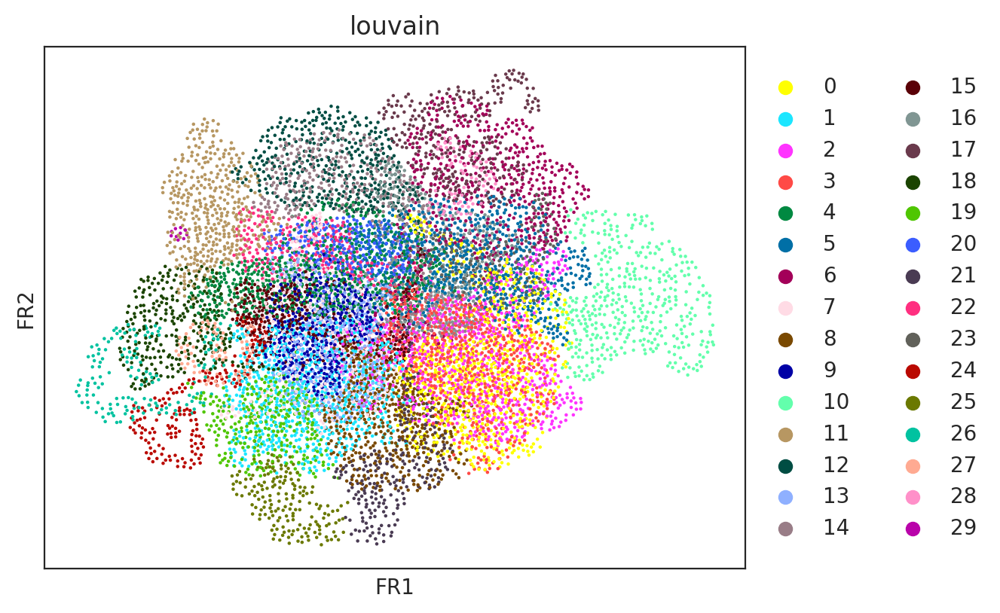

In [11]:
# Check clustering data
sc.pl.draw_graph(oracle.adata, color="louvain")

In [12]:
%%time
# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="louvain", alpha=10,
                         verbose_level=10)

  0%|          | 0/30 [00:00<?, ?it/s]

Inferring GRN for 0...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 1...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 10...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 11...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 12...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 13...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 14...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 15...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 16...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 17...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 18...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 19...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 2...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 20...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 21...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 22...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 23...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 24...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 25...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 26...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 27...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 28...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 29...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 3...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 4...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 5...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 6...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 7...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 8...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for 9...


  0%|          | 0/1542 [00:00<?, ?it/s]

CPU times: user 1h 53min 1s, sys: 1min 58s, total: 1h 54min 59s
Wall time: 2h 27s


In [7]:
links.links_dict.keys()

dict_keys(['0', '1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '4', '5', '6', '7', '8', '9'])

In [8]:
links.links_dict['0']

,source,target,coef_mean,coef_abs,p,-logp
0,Sp6,1110038B12Rik,-0.005627,0.005627,7.477263e-05,4.126257
1,Rora,1110038B12Rik,-0.013675,0.013675,1.603052e-08,7.795052
2,Atf3,1110038B12Rik,-0.009369,0.009369,2.714910e-07,6.566245
3,Zic5,1110038B12Rik,0.000143,0.000143,6.047247e-04,3.218442
4,Npas3,1110038B12Rik,0.005415,0.005415,7.541311e-04,3.122553
...,...,...,...,...,...,...
75083,Egr4,Zswim6,-0.023673,0.023673,2.594937e-07,6.585873
75084,Pou6f2,Zswim6,-0.043855,0.043855,2.346376e-08,7.629602
75085,Nhlh1,Zswim6,0.007052,0.007052,1.187964e-05,4.925197
75086,Id4,Zswim6,-0.027021,0.027021,9.989315e-07,6.000464


In [13]:
links.to_hdf5(file_path="jinlab/links.celloracle.links")

# Pre-Clustered Data

In [3]:
# Download dataset. You can change the code blow to use your data.
adata = co.data_conversion.seurat_object_to_anndata("jinlab/ctxobj.rds",
                                                    delete_tmp_file=True)

input file name: jinlab/ctxobj.rds


Loading required package: SeuratObject
Loading required package: sp

Attaching package: ‘SeuratObject’

The following objects are masked from ‘package:base’:

    intersect, t

loading seurat object ...
  seurat object version is 4x
Processing an assay: RNA
Processing an assay: Crispr


making AnnData ...
2 assays found in the seurat object.
Data is exported as multiple files.
If the seurat object was made by integrating multiple files, please be careful about 'Simpson's effect' in the inferred GRN.
Go to CellOracle web documentation for detailed information about this issue.


In [5]:
raw_count_layer = adata['RNA'].layers['raw_count']
adata['RNA'].X = raw_count_layer
adata = adata['RNA']

In [6]:
# Only consider genes with more than 1 count
sc.pp.filter_genes(adata, min_counts=1)

In [7]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='nCount_RNA')

In [8]:
# Select top 2000 highly-variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)

# Subset the genes
adata = adata[:, filter_result.gene_subset]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)

In [9]:
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()

# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

In [11]:
print(f"Cell number is :{adata.shape[0]}")
print(f"Gene number is :{adata.shape[1]}")

Cell number is :11471
Gene number is :2000


In [10]:
# Load TF info which was made from mouse cell atlas dataset.
base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()

# Check data
base_GRN.head()

,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100050979_100052296,4930430F08Rik,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101006922_101007748,SNORA17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,chr10_101144061_101145000,Mgat4c,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,chr10_10148873_10149183,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_10149425_10149815,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
# Instantiate Oracle object
oracle = co.Oracle()

In [13]:
# Check data in anndata
print("Metadata columns :", list(adata.obs.columns))
print("Dimensional reduction: ", list(adata.obsm.keys()))

Metadata columns : ['Name', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scds', 'cxds', 'bcds', 'RNA_snn_res.0.8', 'seurat_clusters', 'nCount_refAssay', 'nFeature_refAssay', 'predicted.subclass.score', 'predicted.subclass', 'feature_call', 'num_features', 'num_umis', 'nCount_Crispr', 'nFeature_Crispr', 'RNA_snn_res.1.5', 'lowQC', 'CellType', 'Perc', 'CBC', 'antisense', 'intergenic', 'intronic', 'exonic', 'multi', 'unmapped', 'highConf', 'polyA', 'TSO', 'spliced', 'percent_qual_cbc', 'percent_qual_umi', 'nUMI', 'UTR', 'total', 'Rem', 'CellType_Gen', 'Mito', 'demux_type', 'assignment', 'Keep', 'Max', 'MaxVal', 'SecMaxVal', 'demuxHC', 'demuxCR', 'demuxDS', 'assignDS', 'pertgene', 'active_ident', 'n_counts']
Dimensional reduction:  ['X_umap', 'X_pca', 'X_gbm']


... storing 'Name' as categorical
... storing 'orig.ident' as categorical
... storing 'predicted.subclass' as categorical
... storing 'feature_call' as categorical
... storing 'num_umis' as categorical
... storing 'CellType' as categorical
... storing 'CBC' as categorical
... storing 'CellType_Gen' as categorical
... storing 'demux_type' as categorical
... storing 'assignment' as categorical
... storing 'Max' as categorical
... storing 'demuxHC' as categorical
... storing 'demuxCR' as categorical
... storing 'demuxDS' as categorical
... storing 'assignDS' as categorical
... storing 'pertgene' as categorical


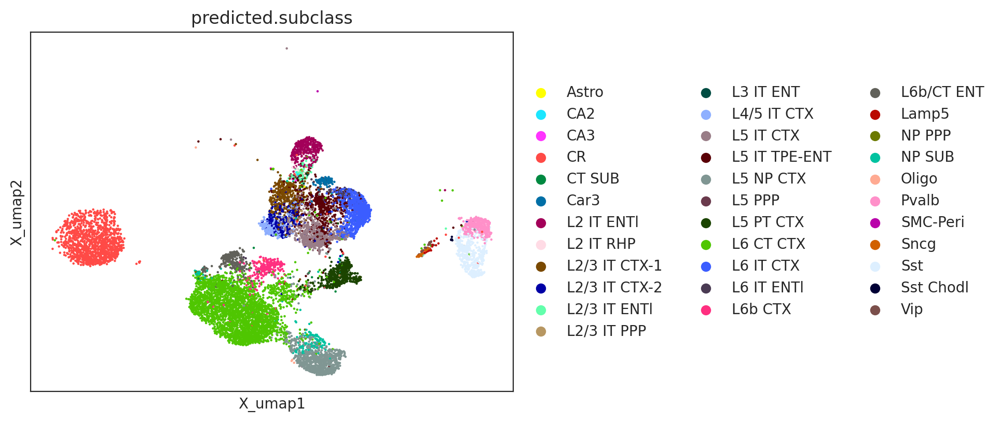

In [14]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="predicted.subclass",
                                   embedding_name="X_umap")

In [15]:
# You can load TF info dataframe with the following code.
oracle.import_TF_data(TF_info_matrix=base_GRN)

# Alternatively, if you saved the informmation as a dictionary, you can use the code below.
# oracle.import_TF_data(TFdict=TFinfo_dictionary)

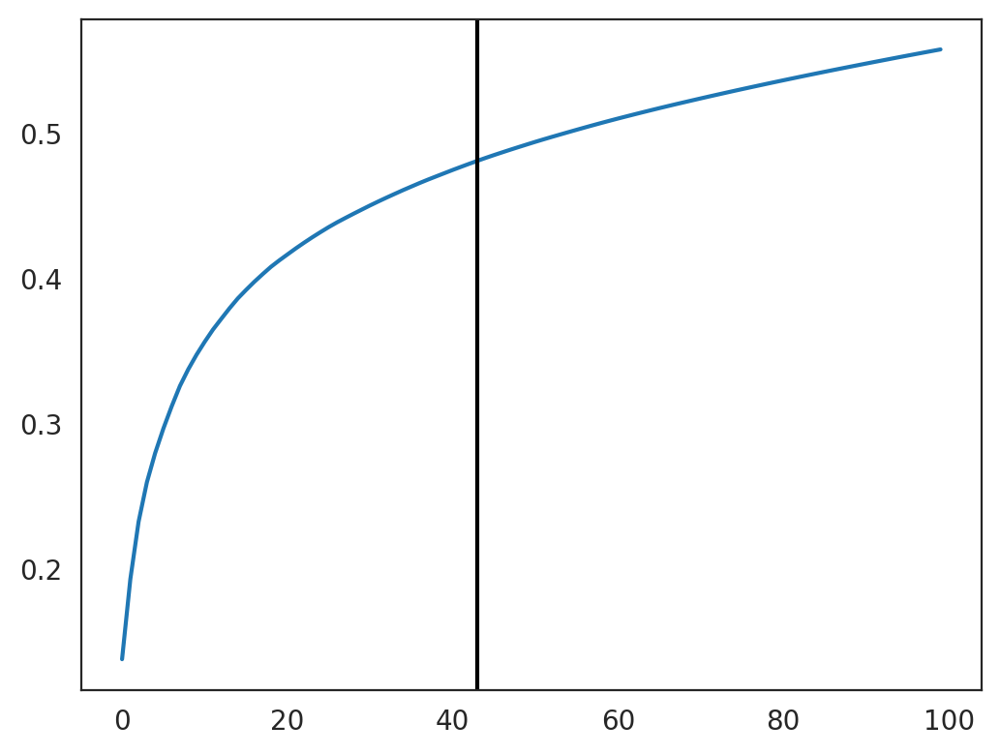

43


In [16]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

In [17]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :11471


In [18]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

Auto-selected k is :286


In [19]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

In [20]:
# Save oracle object.
oracle.to_hdf5("jinlab/ctxobj.subclass.celloracle.oracle")

In [21]:
%%time
# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="predicted.subclass", alpha=10,
                         verbose_level=10)

  0%|          | 0/34 [00:00<?, ?it/s]

Inferring GRN for Astro...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for CA2...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for CA3...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for CR...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for CT SUB...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Car3...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2 IT ENTl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2 IT RHP...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT CTX-1...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT CTX-2...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT ENTl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT PPP...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L3 IT ENT...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L4/5 IT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 IT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 IT TPE-ENT...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 NP CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 PPP...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 PT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6 CT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6 IT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6 IT ENTl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6b CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6b/CT ENT...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Lamp5...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for NP PPP...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for NP SUB...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Oligo...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Pvalb...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for SMC-Peri...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Sncg...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Sst...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Sst Chodl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Vip...


  0%|          | 0/1542 [00:00<?, ?it/s]

CPU times: user 1h 52min 26s, sys: 1min 30s, total: 1h 53min 56s
Wall time: 1h 59min 38s


In [37]:
links.links_dict.keys()

dict_keys(['CA2', 'CA3', 'CR', 'CT SUB', 'Car3', 'L2 IT ENTl', 'L2 IT RHP', 'L2/3 IT CTX-1', 'L2/3 IT CTX-2', 'L2/3 IT ENTl', 'L2/3 IT PPP', 'L3 IT ENT', 'L4/5 IT CTX', 'L5 IT CTX', 'L5 IT TPE-ENT', 'L5 NP CTX', 'L5 PPP', 'L5 PT CTX', 'L6 CT CTX', 'L6 IT CTX', 'L6 IT ENTl', 'L6b CTX', 'L6b/CT ENT', 'Lamp5', 'NP PPP', 'NP SUB', 'Oligo', 'Pvalb', 'SMC-Peri', 'Sncg', 'Sst', 'Sst Chodl', 'Vip'])

In [38]:
links.links_dict[0]

KeyError: 0

In [35]:
links.links_dict.pop('Astro', None)

,source,target,coef_mean,coef_abs,p,-logp
0,Id3,1110038B12Rik,0.0,0.0,NaN,-0.0
1,Maf,1110038B12Rik,0.0,0.0,NaN,-0.0
2,Mafb,1110038B12Rik,0.0,0.0,NaN,-0.0
3,Jun,1110038B12Rik,0.0,0.0,NaN,-0.0
4,Mxi1,1110038B12Rik,0.0,0.0,NaN,-0.0
...,...,...,...,...,...,...
75083,Klf3,Zswim6,0.0,0.0,NaN,-0.0
75084,Glis3,Zswim6,0.0,0.0,NaN,-0.0
75085,Fos,Zswim6,0.0,0.0,NaN,-0.0
75086,Fosb,Zswim6,0.0,0.0,NaN,-0.0


In [31]:
links.to_hdf5(file_path="jinlab/links.subclasses.celloracle.links")

In [43]:
links = co.load_hdf5(file_path="jinlab/links.celloracle.links")

In [44]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)


In [45]:
plt.rcParams["figure.figsize"] = [9, 4.5]


0


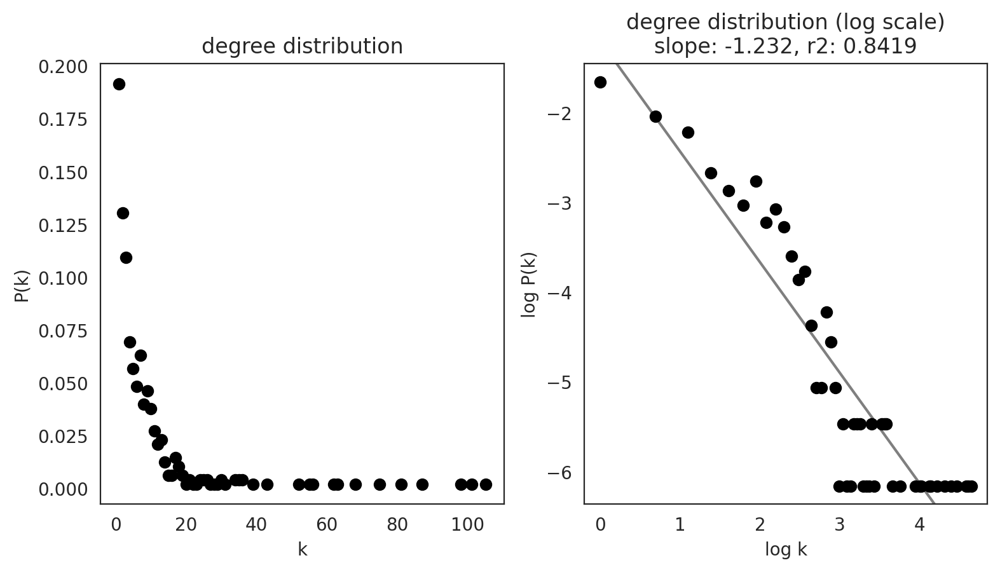

1


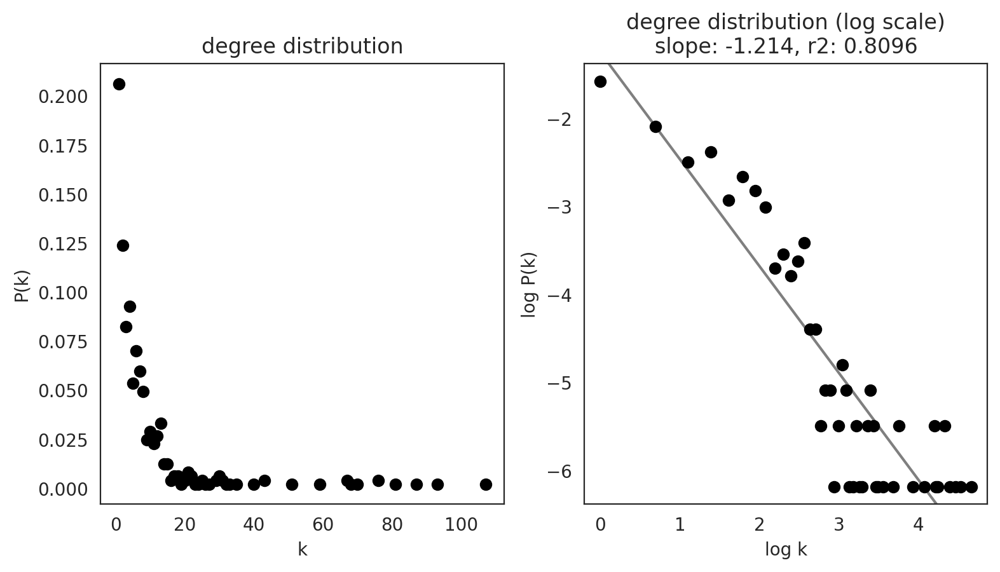

10


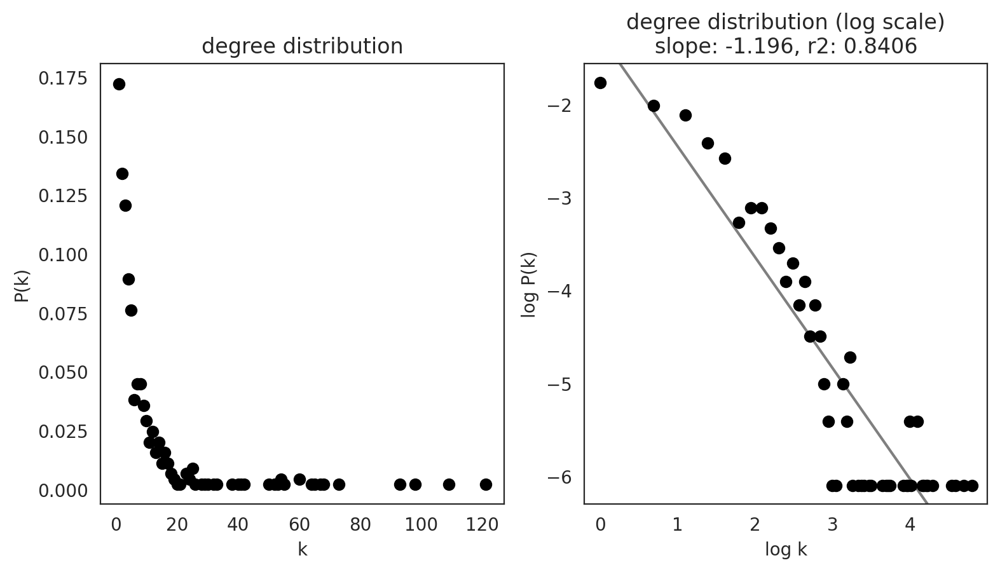

11


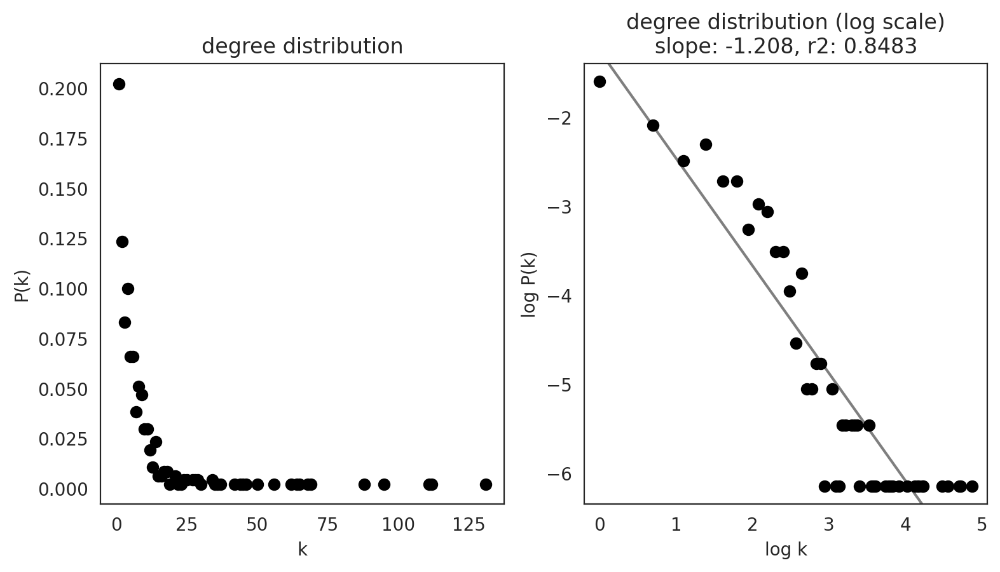

12


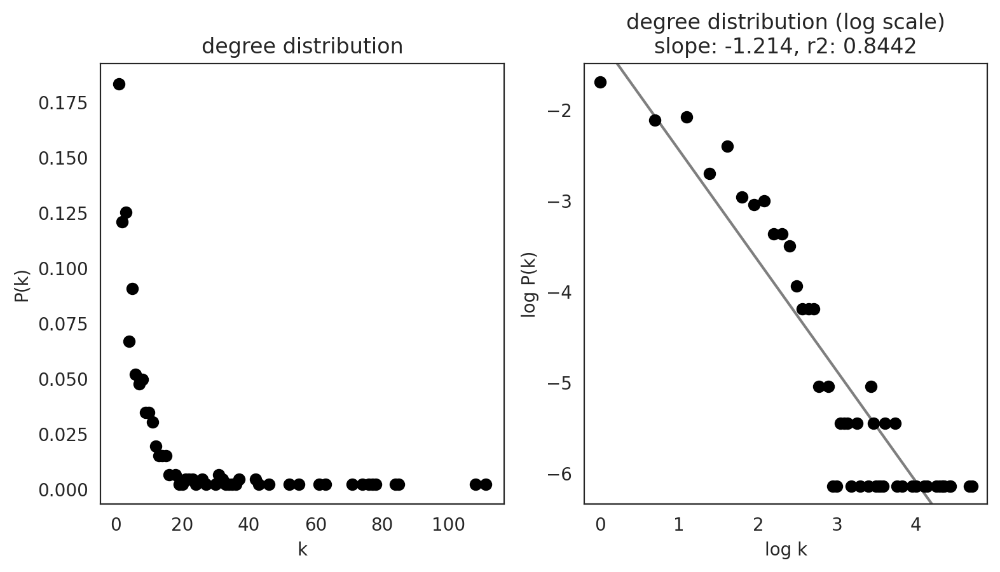

13


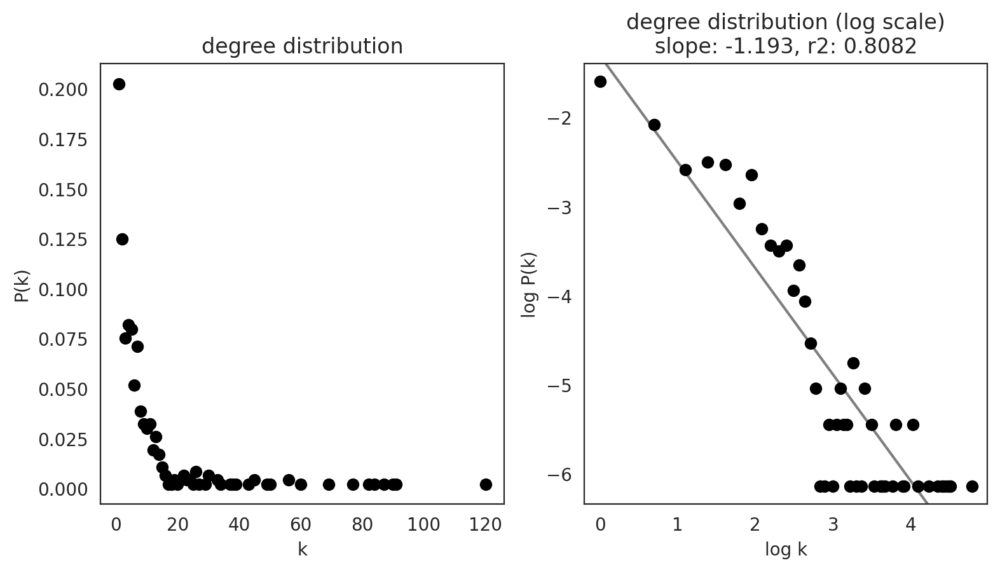

14


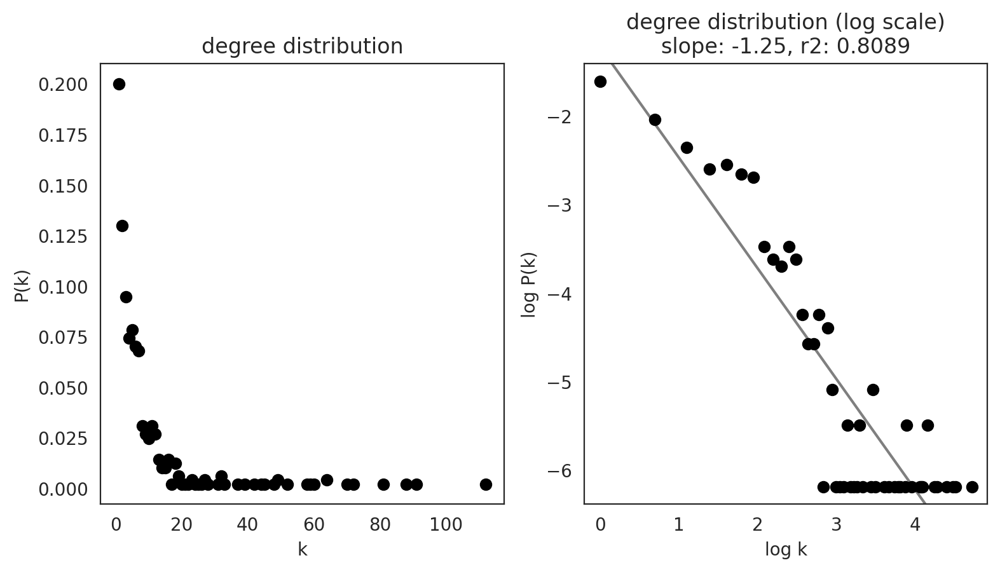

15


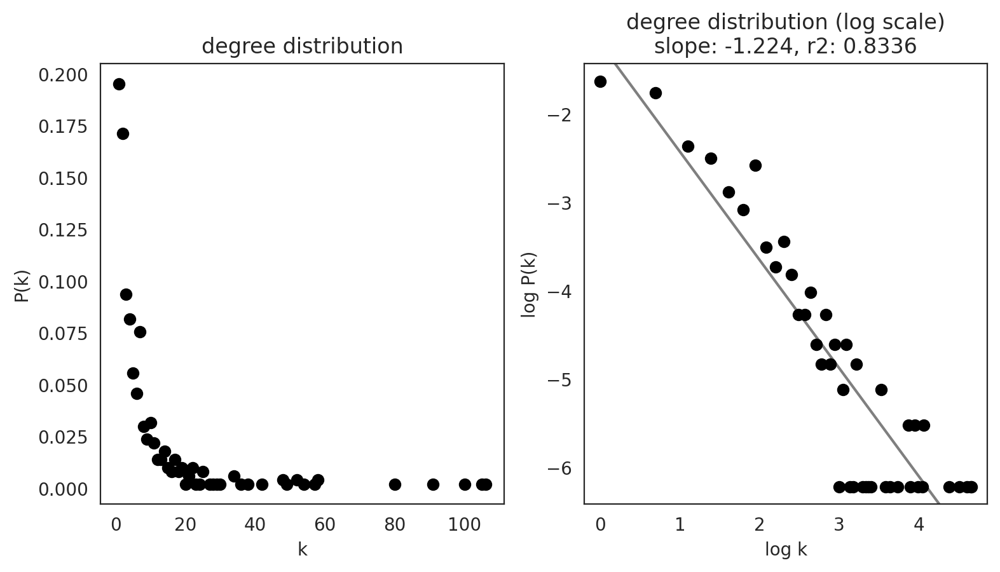

16


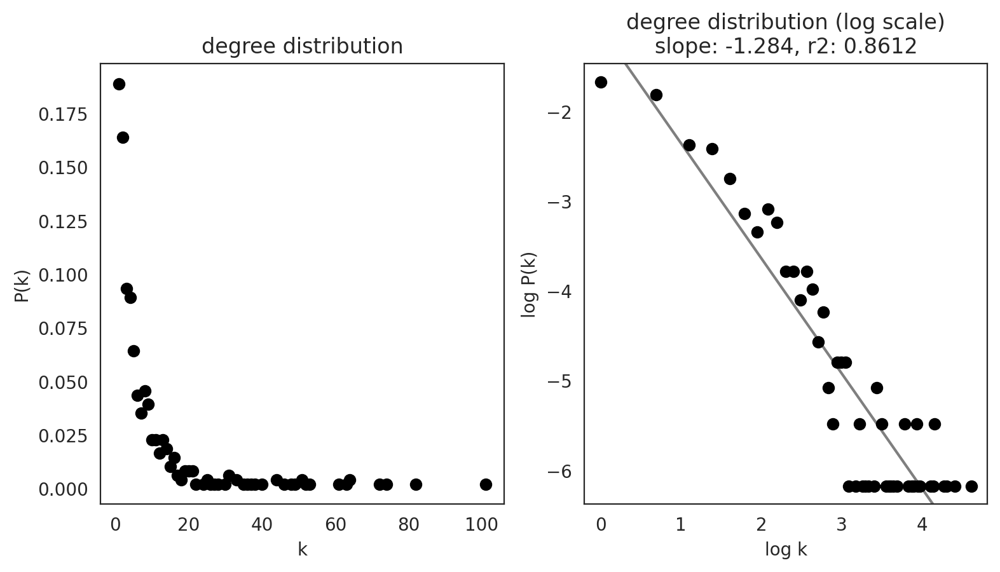

17


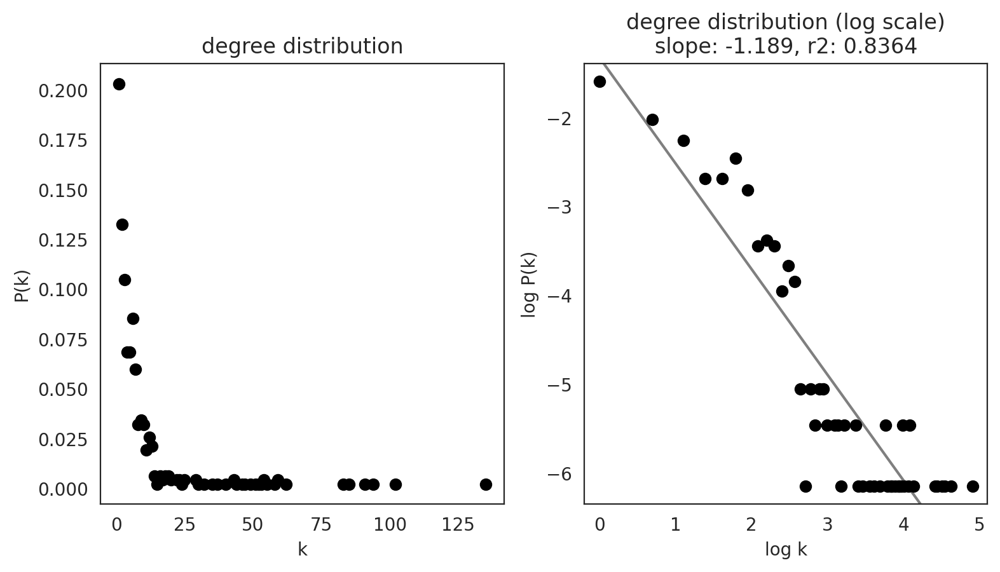

18


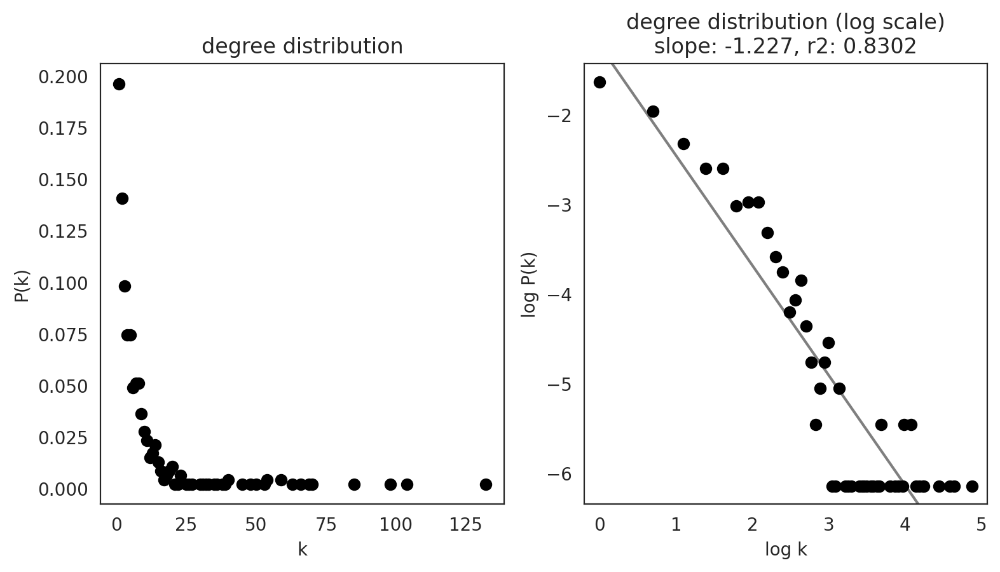

19


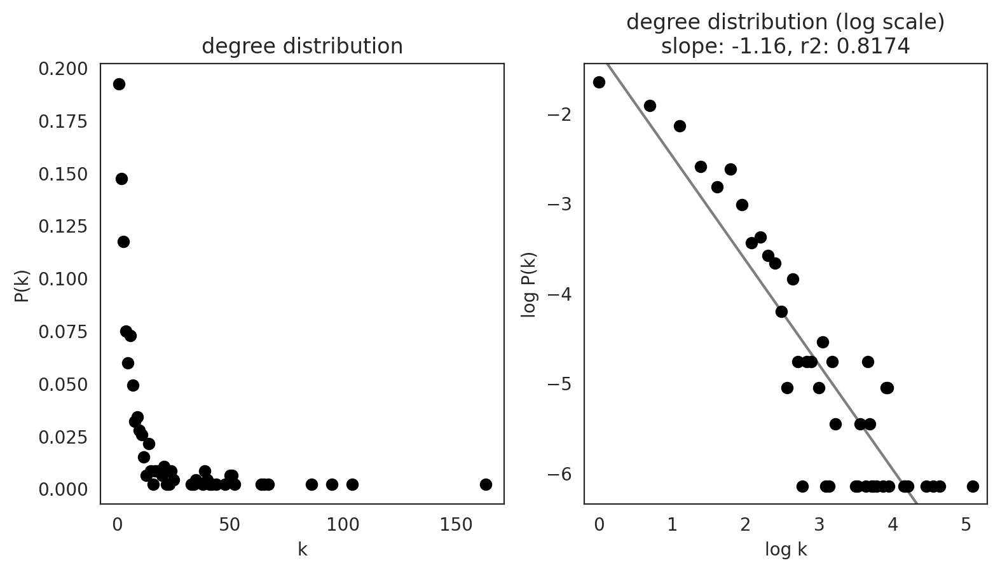

2


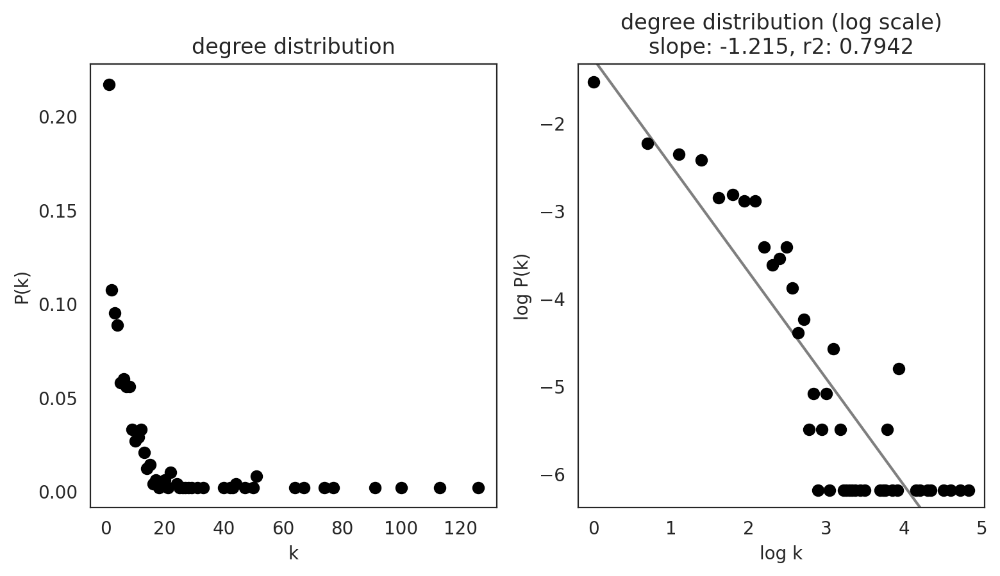

20


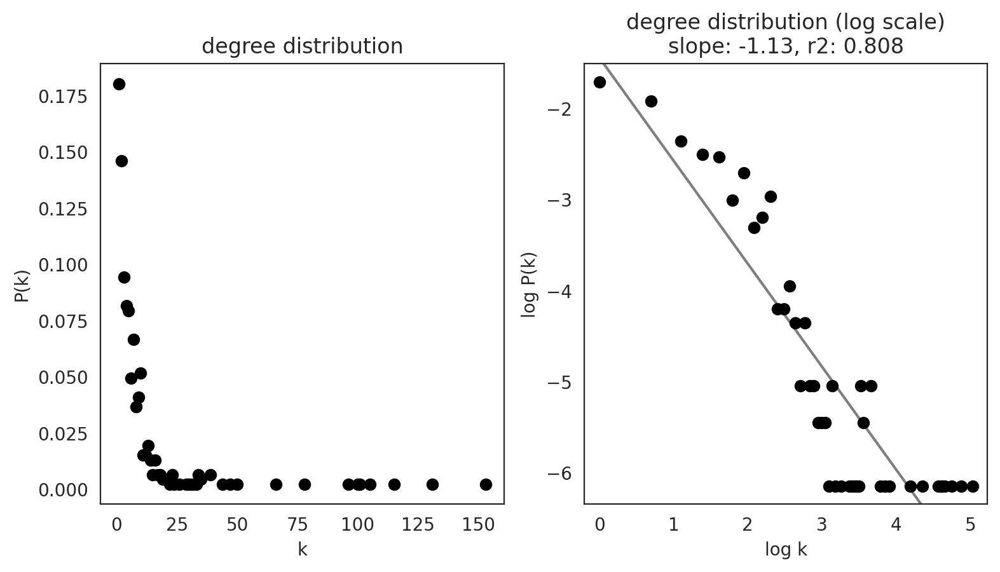

21


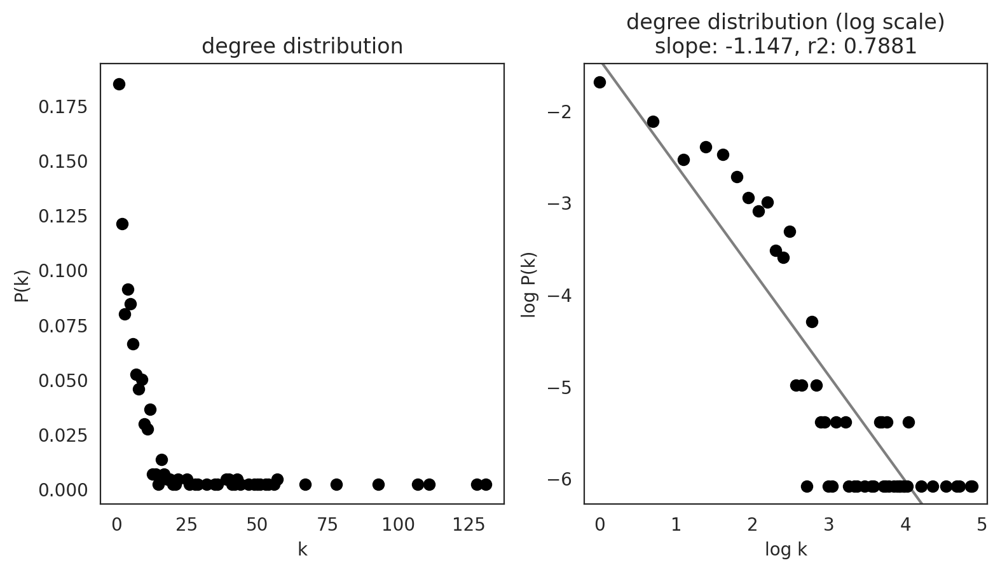

22


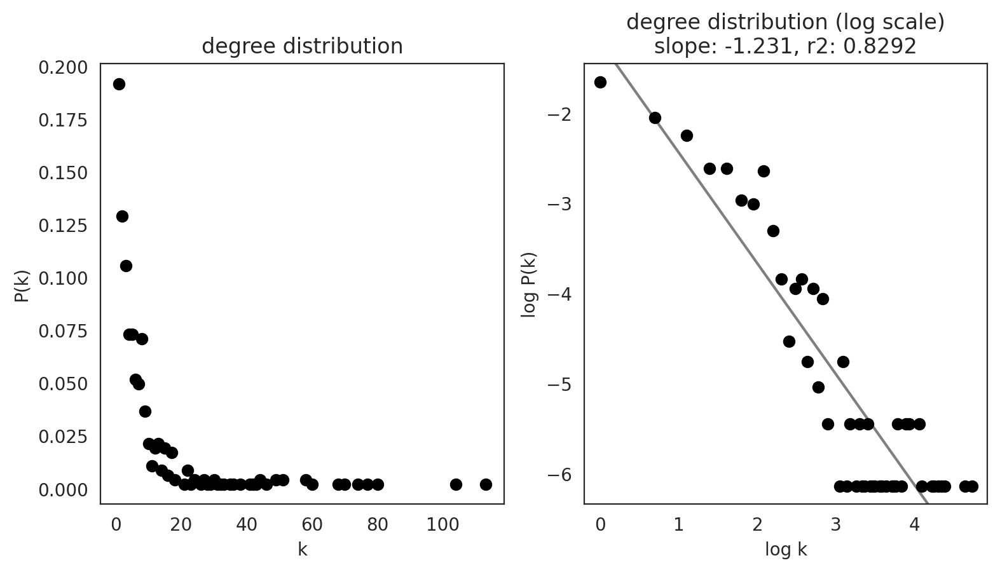

23


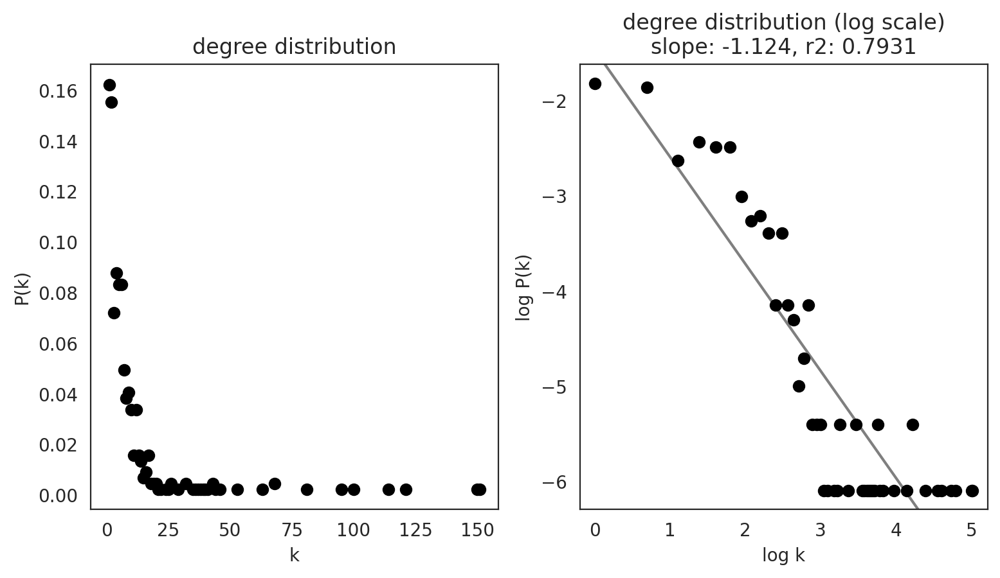

24


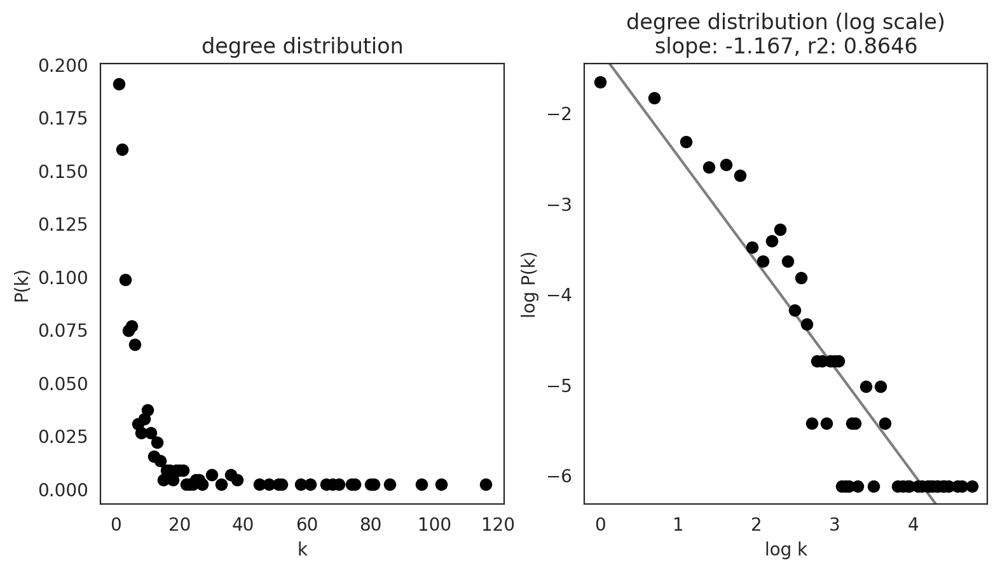

25


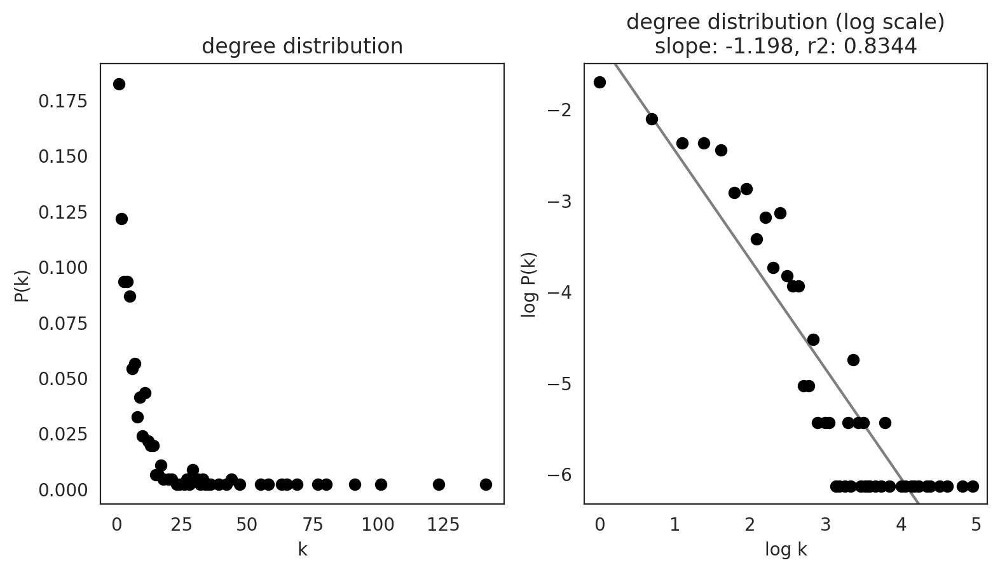

26


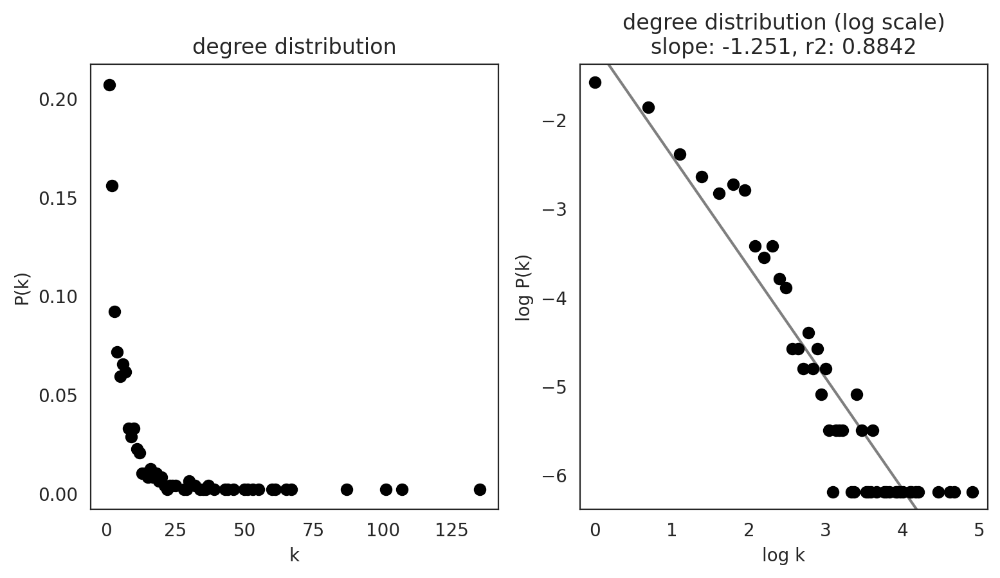

27


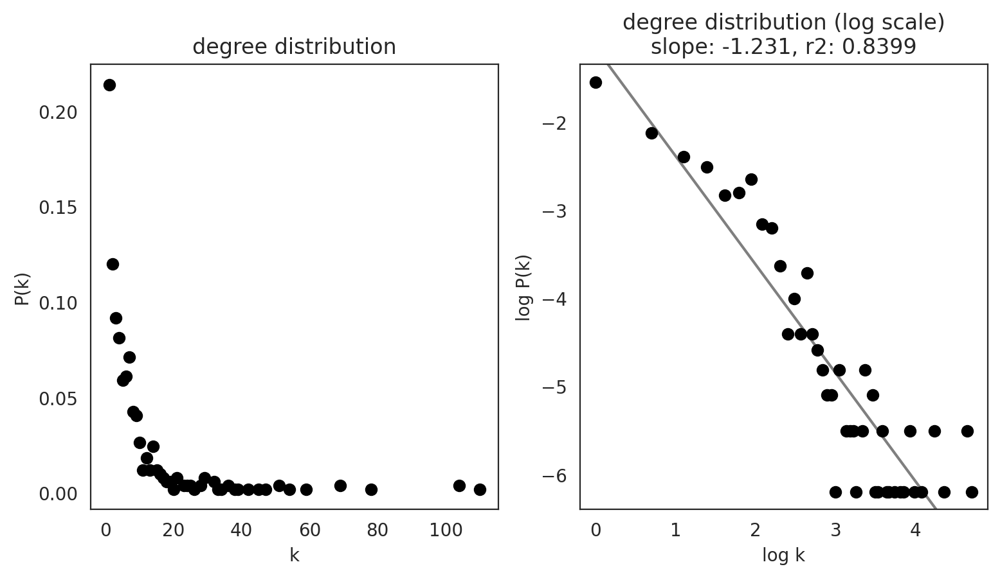

28


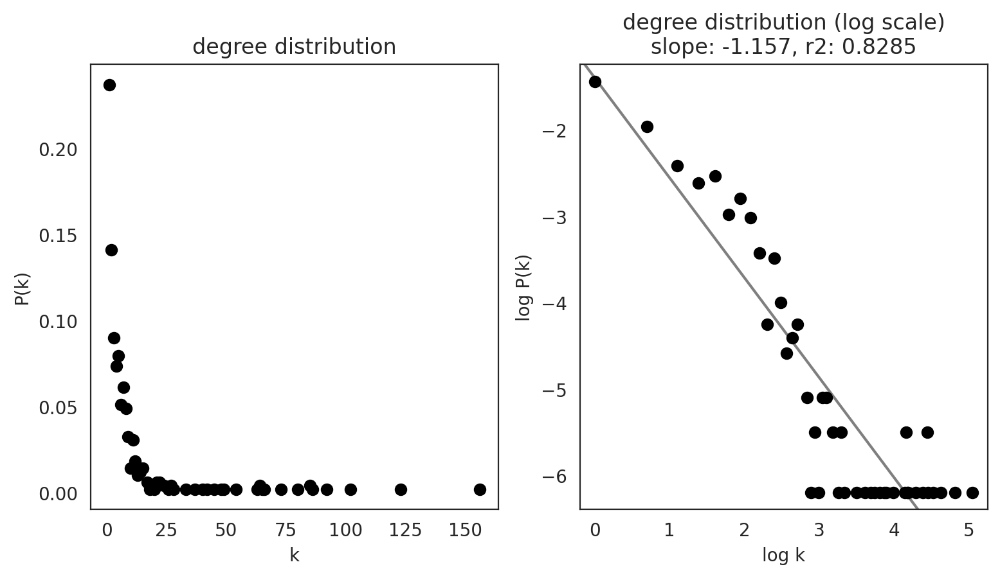

29


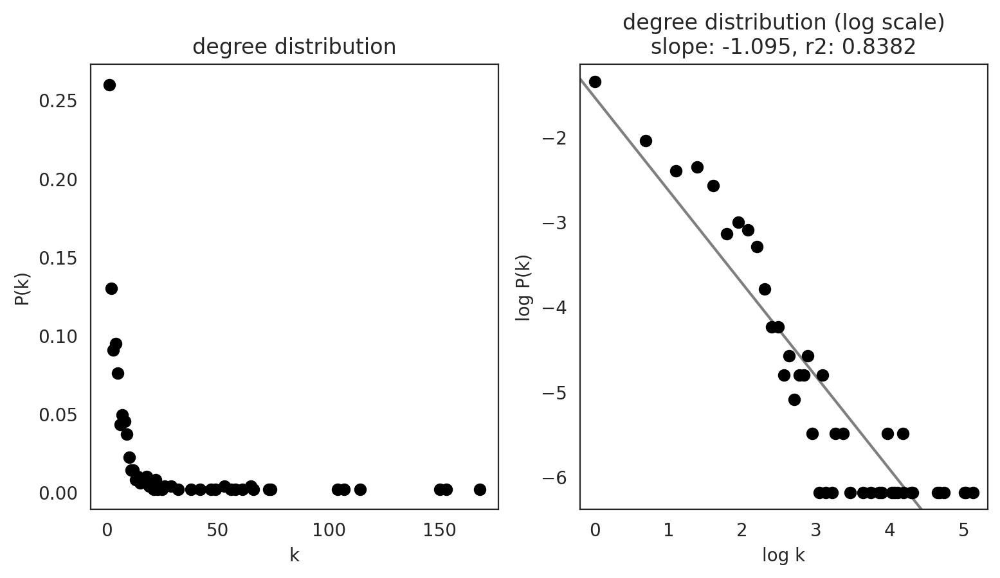

3


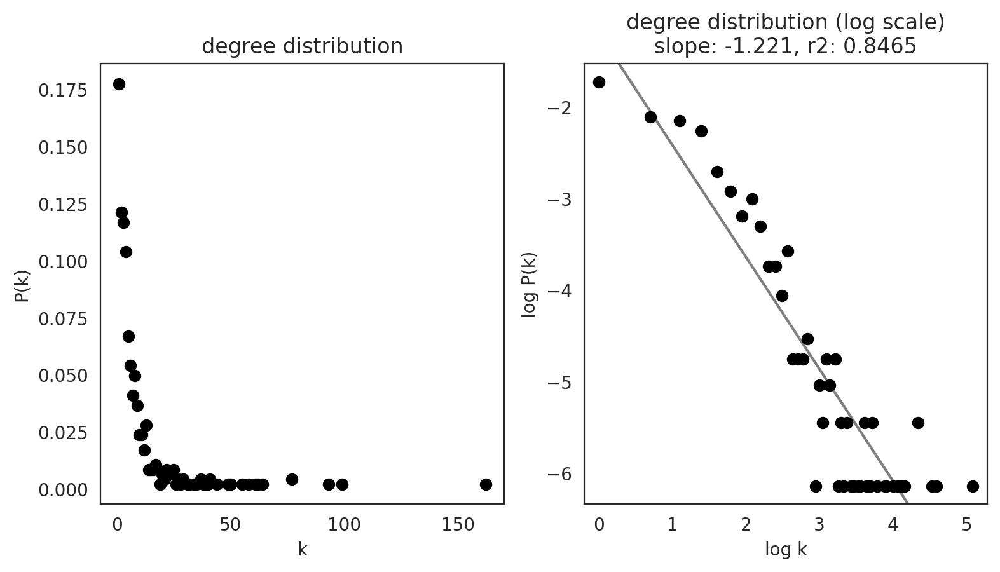

4


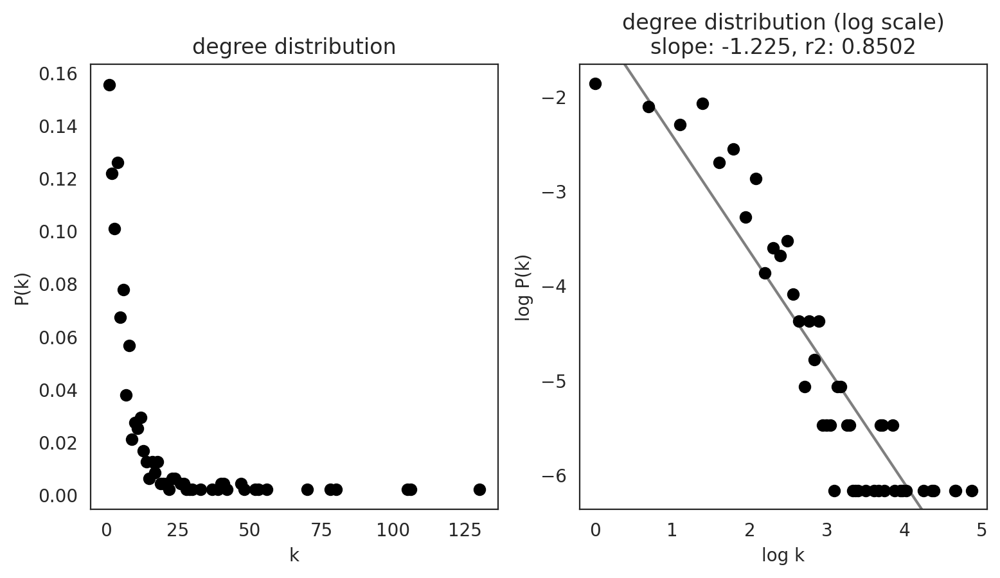

5


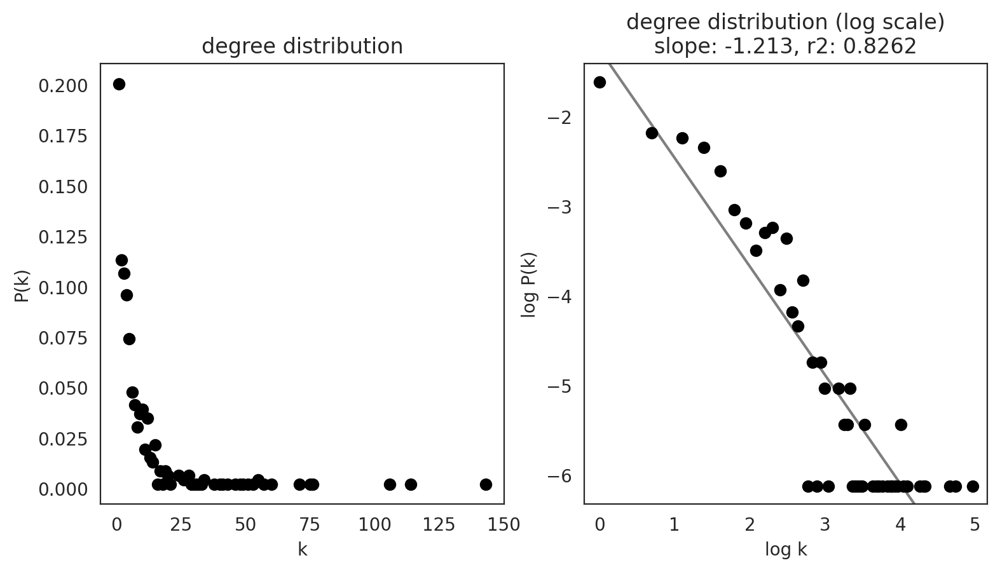

6


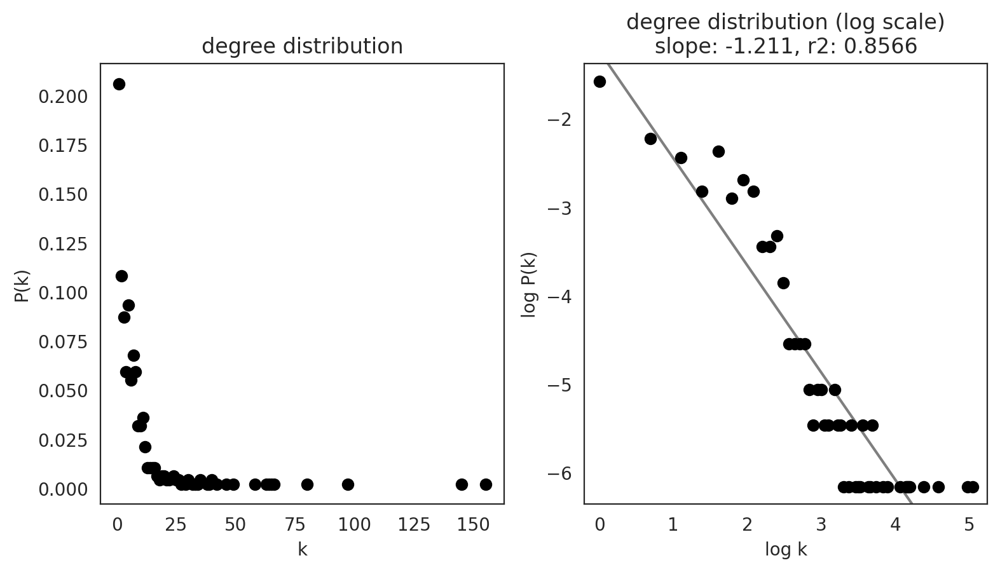

7


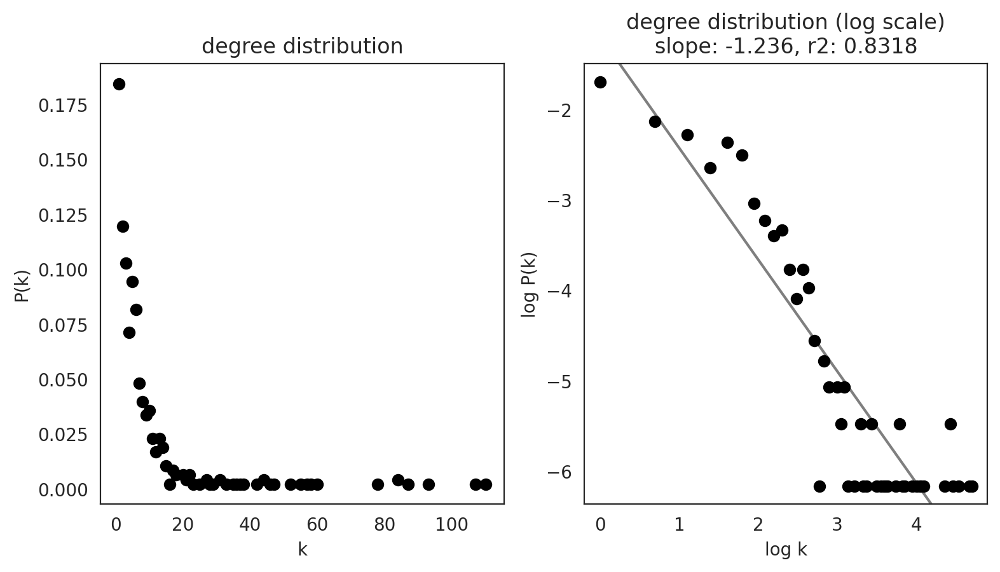

8


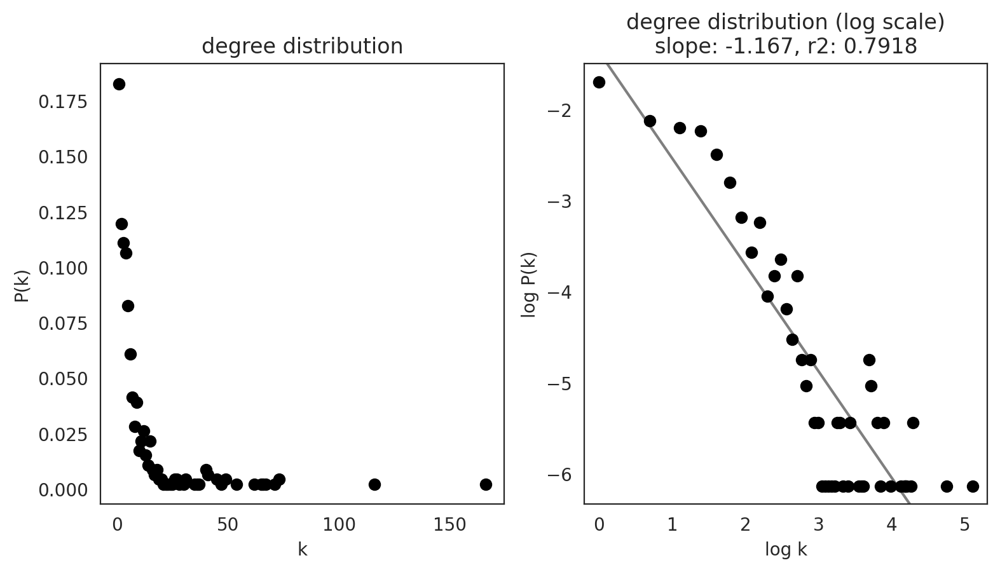

9


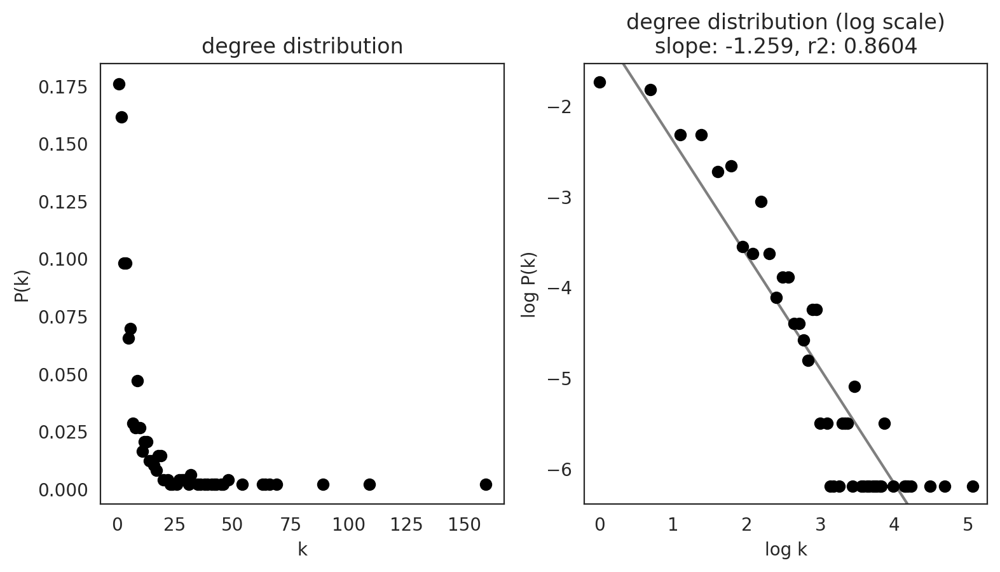

In [46]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

In [47]:
plt.rcParams["figure.figsize"] = [6, 4.5]

In [48]:
# Calculate network scores. 
links.get_network_score()

In [49]:
links.merged_score.head()

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Smad1,87,0.183544,0,0.000000,87,0.183544,0.0,1.000000,0
Cck,14,0.029536,14,0.029536,0,0.000000,0.0,0.565279,0
Sparcl1,9,0.018987,9,0.018987,0,0.000000,0.0,0.359906,0
Id3,5,0.010549,0,0.000000,5,0.010549,0.0,0.120180,0
Bhlhe22,18,0.037975,6,0.012658,12,0.025316,133.0,0.123591,0


In [50]:
# Save Links object.
links.to_hdf5(file_path="links.celloracle.links")

In [51]:
# Check cluster name
links.cluster

['0',
 '1',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '2',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28',
 '29',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9']

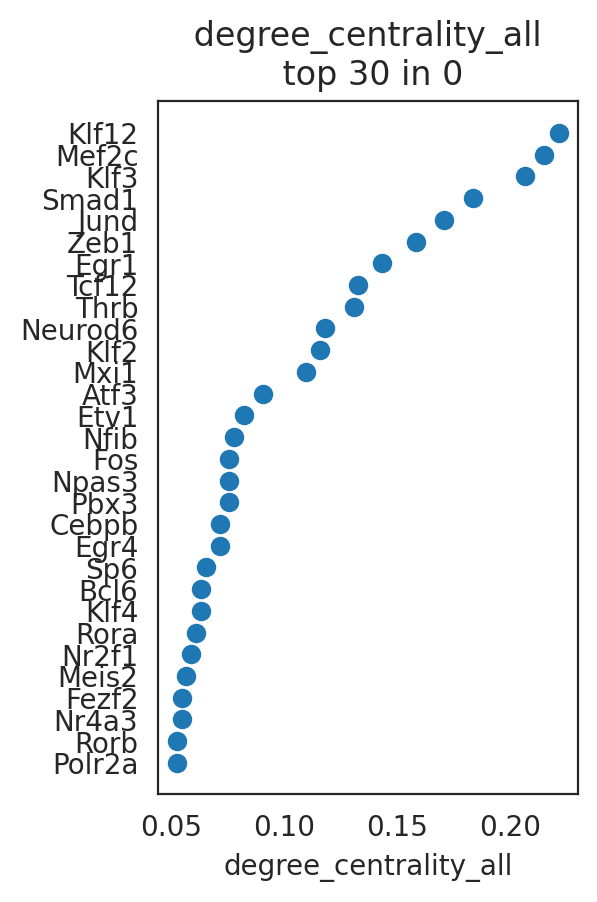

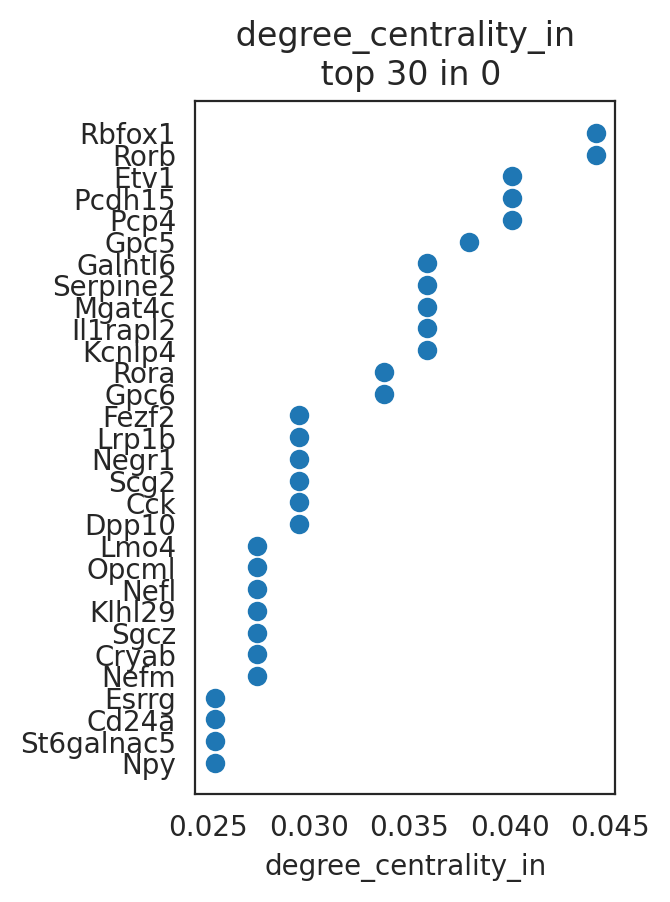

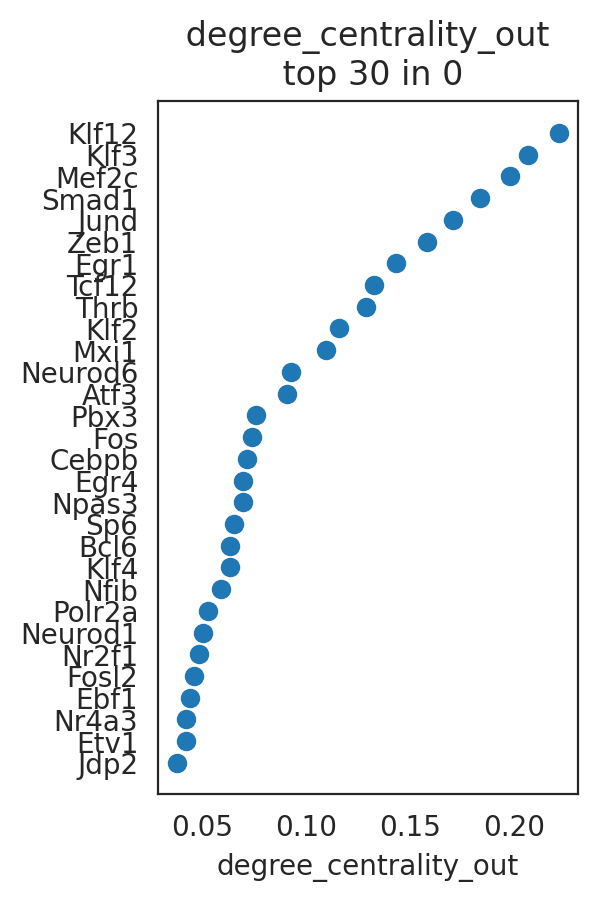

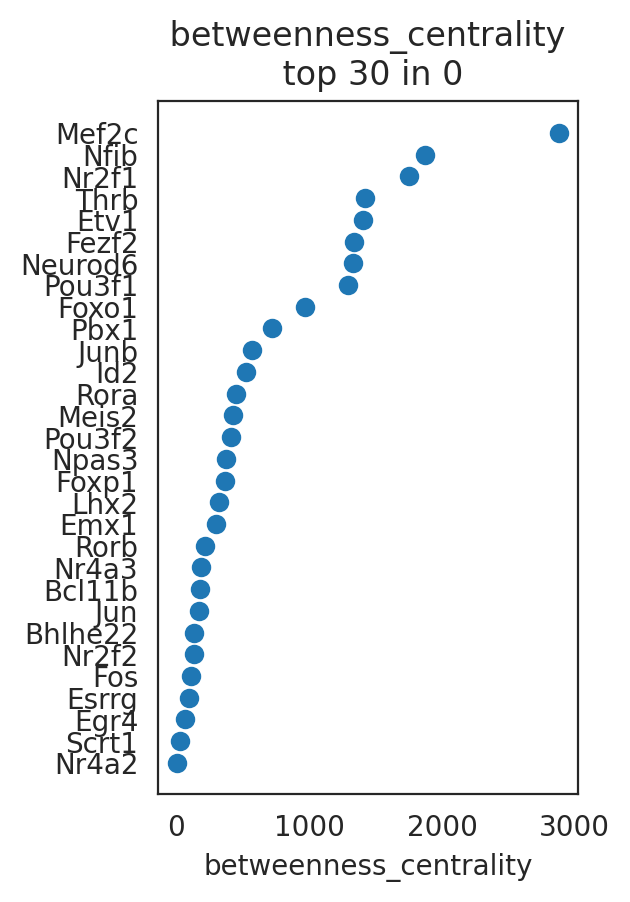

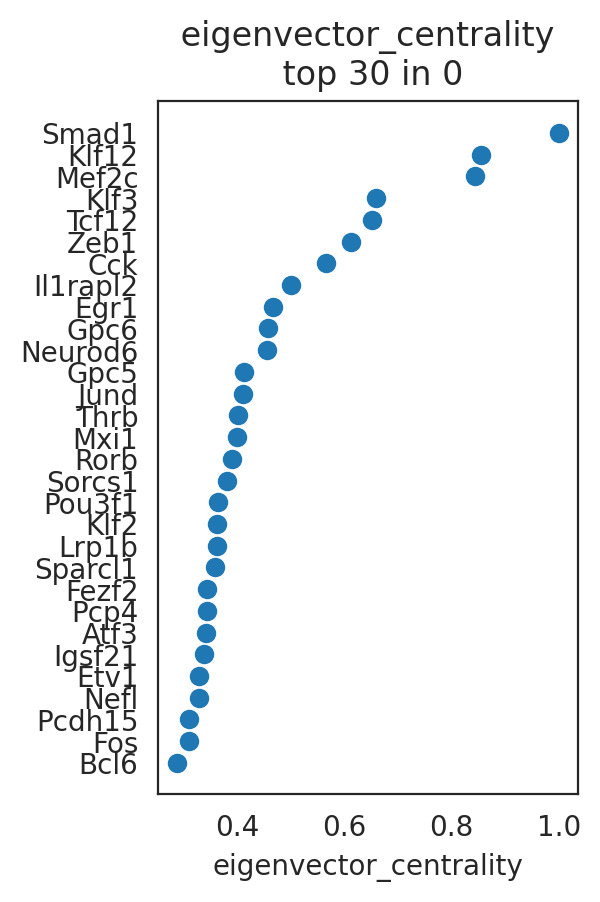

In [52]:
# Visualize top n-th genes with high scores.
links.plot_scores_as_rank(cluster="0", n_gene=30
                          #, save=f"{save_folder}/ranked_score"
                         )

In [53]:
import os
import sys

import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

In [ ]:
# Check gene expression
goi = "Gata1"
sc.pl.draw_graph(oracle.adata, color=[goi, oracle.cluster_column_name],
                 layer="imputed_count", use_raw=False, cmap="viridis")

In [3]:
oracle = co.load_hdf5("jinlab/ctxobj.celloracle.oracle")

In [4]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 11471
    n_genes: 2000
    cluster_name: louvain
    dimensional_reduction_name: X_draw_graph_fr
    n_target_genes_in_TFdict: 21256 genes
    n_regulatory_in_TFdict: 1093 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 153 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 1542 genes
    k_for_knn_imputation: 286
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [6]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline

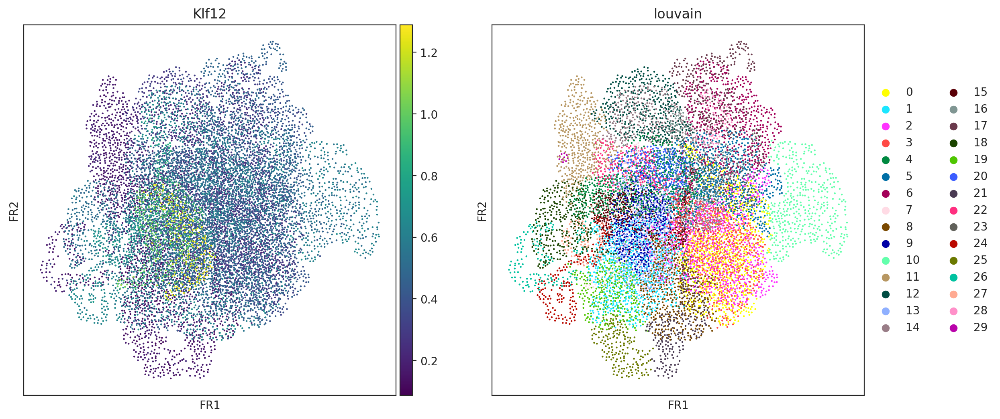

In [7]:
# Check gene expression 
goi = "Klf12"
sc.pl.draw_graph(oracle.adata, color=[goi, oracle.cluster_column_name],
                 layer="imputed_count", use_raw=False, cmap="viridis")

In [4]:
oracle = co.load_hdf5("jinlab/ctxobj.subclass.celloracle.oracle")

In [5]:
links = co.load_hdf5("jinlab/links.subclasses.celloracle.links")

In [10]:
oracle.adata.to_df()['Foxg1']


Ch1_AAACCTGTCAGGTTCA-1    0.914518
Ch1_AAACCTGTCCTTTACA-1    1.246108
Ch1_AAACGGGCACAGGAGT-1    0.000000
Ch1_AAACGGGCATGCAATC-1    1.078187
Ch1_AAACGGGGTAATAGCA-1    0.828548
                            ...   
Ch5_TTTGGTTGTTCACGGC-1    1.098380
Ch5_TTTGGTTTCGAACGGA-1    0.000000
Ch5_TTTGGTTTCTTTACGT-1    1.302648
Ch5_TTTGTCAGTTGACGTT-1    0.000000
Ch5_TTTGTCATCTACTTAC-1    0.000000
Name: Foxg1, Length: 11471, dtype: float32

In [26]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, GRN_unit='cluster',
                              use_cluster_specific_TFdict=True)

  0%|          | 0/34 [00:00<?, ?it/s]

In [27]:
goi = "Foxg1"
# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={goi: 0.0}, GRN_unit='cluster',
                      n_propagation=3)

In [28]:
oracle.adata

AnnData object with n_obs × n_vars = 11471 × 2000
    obs: 'Name', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scds', 'cxds', 'bcds', 'RNA_snn_res.0.8', 'seurat_clusters', 'nCount_refAssay', 'nFeature_refAssay', 'predicted.subclass.score', 'predicted.subclass', 'feature_call', 'num_features', 'num_umis', 'nCount_Crispr', 'nFeature_Crispr', 'RNA_snn_res.1.5', 'lowQC', 'CellType', 'Perc', 'CBC', 'antisense', 'intergenic', 'intronic', 'exonic', 'multi', 'unmapped', 'highConf', 'polyA', 'TSO', 'spliced', 'percent_qual_cbc', 'percent_qual_umi', 'nUMI', 'UTR', 'total', 'Rem', 'CellType_Gen', 'Mito', 'demux_type', 'assignment', 'Keep', 'Max', 'MaxVal', 'SecMaxVal', 'demuxHC', 'demuxCR', 'demuxDS', 'assignDS', 'pertgene', 'active_ident', 'n_counts'
    var: 'variable_gene', 'n_counts', 'mean', 'std', 'symbol', 'isin_top1000_var_mean_genes', 'isin_TFdict_targets', 'isin_TFdict_regulators', 'isin_actve_regulators'
    uns: 'RNA_snn_res.0.8_colors', 'seurat_clusters_colors', 'active_ident_colors

In [19]:
oracle.adata.layers['normalized_count']

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 5357821 stored elements and shape (11471, 2000)>

In [13]:
oracle.adata.layers['simulation_input']

array([[2.44440184e-01, 2.50673371e-01, 6.06560375e-03, ...,
        3.43093626e+00, 3.24360022e+00, 3.24474251e+00],
       [2.91684661e-01, 3.06507995e-02, 6.46020955e-03, ...,
        3.52753722e+00, 3.32065317e+00, 3.28095083e+00],
       [2.51793417e-02, 4.14591301e-03, 0.00000000e+00, ...,
        3.13172060e+00, 3.03224812e+00, 2.85473342e+00],
       ...,
       [1.55508759e-01, 1.38798917e-03, 3.38898760e-03, ...,
        3.42111656e+00, 3.31742161e+00, 3.14715019e+00],
       [1.83464667e-02, 0.00000000e+00, 4.91679047e-03, ...,
        3.17659612e+00, 2.91808031e+00, 2.81646923e+00],
       [1.63061885e-01, 0.00000000e+00, 3.00637635e-03, ...,
        3.43252000e+00, 3.34605370e+00, 3.17634827e+00]])

In [30]:
oracle.adata.layers['delta_X']

array([[ 4.86146588e-03,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 1.20336363e-04,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-3.88707319e-06,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       ...,
       [ 2.72366827e-03,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-2.21163178e-06,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-3.02171772e-05,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [15]:
oracle.adata.layers['simulated_count']

array([[2.49301650e-01, 2.50673371e-01, 6.06560375e-03, ...,
        3.43093626e+00, 3.24360022e+00, 3.24474251e+00],
       [2.91804998e-01, 3.06507995e-02, 6.46020955e-03, ...,
        3.52753722e+00, 3.32065317e+00, 3.28095083e+00],
       [2.51754546e-02, 4.14591301e-03, 0.00000000e+00, ...,
        3.13172060e+00, 3.03224812e+00, 2.85473342e+00],
       ...,
       [1.58232427e-01, 1.38798917e-03, 3.38898760e-03, ...,
        3.42111656e+00, 3.31742161e+00, 3.14715019e+00],
       [1.83442550e-02, 0.00000000e+00, 4.91679047e-03, ...,
        3.17659612e+00, 2.91808031e+00, 2.81646923e+00],
       [1.63031668e-01, 0.00000000e+00, 3.00637635e-03, ...,
        3.43252000e+00, 3.34605370e+00, 3.17634827e+00]])

In [22]:
test_adata = oracle.adata.copy()

In [23]:
test_adata

AnnData object with n_obs × n_vars = 11471 × 2000
    obs: 'Name', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scds', 'cxds', 'bcds', 'RNA_snn_res.0.8', 'seurat_clusters', 'nCount_refAssay', 'nFeature_refAssay', 'predicted.subclass.score', 'predicted.subclass', 'feature_call', 'num_features', 'num_umis', 'nCount_Crispr', 'nFeature_Crispr', 'RNA_snn_res.1.5', 'lowQC', 'CellType', 'Perc', 'CBC', 'antisense', 'intergenic', 'intronic', 'exonic', 'multi', 'unmapped', 'highConf', 'polyA', 'TSO', 'spliced', 'percent_qual_cbc', 'percent_qual_umi', 'nUMI', 'UTR', 'total', 'Rem', 'CellType_Gen', 'Mito', 'demux_type', 'assignment', 'Keep', 'Max', 'MaxVal', 'SecMaxVal', 'demuxHC', 'demuxCR', 'demuxDS', 'assignDS', 'pertgene', 'active_ident', 'n_counts'
    var: 'variable_gene', 'n_counts', 'mean', 'std', 'symbol', 'isin_top1000_var_mean_genes', 'isin_TFdict_targets', 'isin_TFdict_regulators', 'isin_actve_regulators'
    uns: 'RNA_snn_res.0.8_colors', 'seurat_clusters_colors', 'active_ident_colors

In [24]:
test_adata.X = test_adata.layers['delta_X']

In [25]:
test_adata.to_df()

,Rgs20,Oprk1,St18,Sntg1,Vxn,Cpa6,A830018L16Rik,Sulf1,Eya1,Kcnb2,...,Frmpd4,Amelx,Mid1,Eif2s3y,Gm28102,mt-Co1,mt-Co2,mt-Atp6,mt-Co3,mt-Cytb
Ch1_AAACCTGTCAGGTTCA-1,0.004861,0.0,0.0,0.001799,0.0,0.000000,-0.006236,0.000000,0.0,-0.004616,...,0.026896,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Ch1_AAACCTGTCCTTTACA-1,0.000120,0.0,0.0,0.001962,0.0,0.000000,0.000917,0.000000,0.0,0.000183,...,0.001951,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Ch1_AAACGGGCACAGGAGT-1,-0.000004,0.0,0.0,0.000000,0.0,0.000000,0.000034,0.000000,0.0,0.000011,...,0.000009,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Ch1_AAACGGGCATGCAATC-1,-0.000866,0.0,0.0,0.001752,0.0,0.000000,-0.065644,0.000000,0.0,-0.004654,...,0.040640,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Ch1_AAACGGGGTAATAGCA-1,-0.000092,0.0,0.0,-0.003405,0.0,0.000000,0.023992,-0.000035,0.0,0.018095,...,-0.008318,0.0,0.0,0.000232,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ch5_TTTGGTTGTTCACGGC-1,0.012682,0.0,0.0,0.010348,0.0,-0.009190,0.005673,0.008651,0.0,-0.043539,...,-0.000877,0.0,0.0,-0.001457,0.0,0.0,0.0,0.0,0.0,0.0
Ch5_TTTGGTTTCGAACGGA-1,0.016186,0.0,0.0,0.013207,0.0,-0.011728,0.007240,0.011041,0.0,-0.055567,...,-0.001120,0.0,0.0,-0.001859,0.0,0.0,0.0,0.0,0.0,0.0
Ch5_TTTGGTTTCTTTACGT-1,0.002724,0.0,0.0,-0.001007,0.0,0.000000,-0.025273,0.000000,0.0,0.002352,...,0.017067,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0
Ch5_TTTGTCAGTTGACGTT-1,-0.000002,0.0,0.0,0.000000,0.0,0.000000,0.000019,0.000000,0.0,0.000006,...,0.000005,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
oracle.adata

AnnData object with n_obs × n_vars = 11471 × 2000
    obs: 'Name', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scds', 'cxds', 'bcds', 'RNA_snn_res.0.8', 'seurat_clusters', 'nCount_refAssay', 'nFeature_refAssay', 'predicted.subclass.score', 'predicted.subclass', 'feature_call', 'num_features', 'num_umis', 'nCount_Crispr', 'nFeature_Crispr', 'RNA_snn_res.1.5', 'lowQC', 'CellType', 'Perc', 'CBC', 'antisense', 'intergenic', 'intronic', 'exonic', 'multi', 'unmapped', 'highConf', 'polyA', 'TSO', 'spliced', 'percent_qual_cbc', 'percent_qual_umi', 'nUMI', 'UTR', 'total', 'Rem', 'CellType_Gen', 'Mito', 'demux_type', 'assignment', 'Keep', 'Max', 'MaxVal', 'SecMaxVal', 'demuxHC', 'demuxCR', 'demuxDS', 'assignDS', 'pertgene', 'active_ident', 'n_counts'
    var: 'variable_gene', 'n_counts', 'mean', 'std', 'symbol', 'isin_top1000_var_mean_genes', 'isin_TFdict_targets', 'isin_TFdict_regulators'
    uns: 'RNA_snn_res.0.8_colors', 'seurat_clusters_colors', 'active_ident_colors', 'log1p', 'predicted.su

In [15]:
oracle.adata.obs['predicted.subclass'].value_counts()

L6 CT CTX        3188
CR               1324
L6 IT CTX         877
L5 NP CTX         876
L5 IT CTX         651
L5 IT TPE-ENT     645
L5 PT CTX         525
Sst               468
Pvalb             415
L2/3 IT CTX-1     406
L2 IT ENTl        340
L6b/CT ENT        306
L2/3 IT CTX-2     296
L4/5 IT CTX       252
L6b CTX           249
NP SUB            182
Car3              122
L2/3 IT ENTl       79
L6 IT ENTl         79
Sncg               42
L2 IT RHP          30
Vip                26
Lamp5              19
L3 IT ENT          18
L2/3 IT PPP        12
CT SUB              9
Oligo               9
NP PPP              7
CA2                 6
CA3                 5
Sst Chodl           5
Astro               1
SMC-Peri            1
L5 PPP              1
Name: predicted.subclass, dtype: int64

In [12]:
astro_adata = oracle.adata[oracle.adata.obs['predicted.subclass'] == 'Astro'].copy()


In [14]:
astro_adata.to_df()


,Rgs20,Oprk1,St18,Sntg1,Vxn,Cpa6,A830018L16Rik,Sulf1,Eya1,Kcnb2,...,Frmpd4,Amelx,Mid1,Eif2s3y,Gm28102,mt-Co1,mt-Co2,mt-Atp6,mt-Co3,mt-Cytb
Ch4_TTGGAACAGCCACCTG-1,1.153734,0.0,0.0,1.153734,0.433405,0.0,1.153734,0.0,0.0,1.675228,...,1.153734,0.0,0.0,0.433405,0.0,3.428734,3.169058,3.277053,3.07339,3.410985


# Control Specific Clustering

In [3]:
# Download dataset. You can change the code blow to use your data.
adata = co.data_conversion.seurat_object_to_anndata("jinlab/ctxobj.rds",
                                                    delete_tmp_file=True)

input file name: jinlab/ctxobj.rds


Loading required package: SeuratObject
Loading required package: sp

Attaching package: ‘SeuratObject’

The following objects are masked from ‘package:base’:

    intersect, t

loading seurat object ...
  seurat object version is 4x
Processing an assay: RNA
Processing an assay: Crispr


making AnnData ...
2 assays found in the seurat object.
Data is exported as multiple files.
If the seurat object was made by integrating multiple files, please be careful about 'Simpson's effect' in the inferred GRN.
Go to CellOracle web documentation for detailed information about this issue.


In [4]:
adata["RNA"].obs['assignDS'].value_counts()

Tcf4_2        1043
GFP            918
Foxg1_1        889
NonTarget1     845
Tcf4_3         827
Nr2f1_3        792
Tbr1_1         792
SafeTarget     781
NonTarget2     712
Nr2f1_1        702
Foxg1_2        689
Tcf4_1         613
Foxg1_3        556
Nr2f1_2        522
Tbr1_3         477
Tbr1_2         313
Name: assignDS, dtype: int64

In [15]:
control = ['NonTarget1', 'NonTarget2', 'SafeTarget', 'GFP']
ctrl_adata = filtered_adata[filtered_adata.obs['assignDS'].isin(control)].copy()

In [41]:
# Only consider genes with more than 1 count
sc.pp.filter_genes(ctrl_adata, min_counts=1)

In [42]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(ctrl_adata, key_n_counts='nCount_RNA')

In [44]:
filter_result = sc.pp.filter_genes_dispersion(ctrl_adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)


In [45]:
filter_result.gene_subset

array([False, False, False, ..., False, False, False])

In [16]:
column_labels = oracle.adata.var_names.tolist()

In [17]:
ctrl_adata = ctrl_adata[:, ctrl_adata.var_names.isin(column_labels)]


In [50]:
ctrl_adata.layers["raw_count"]

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 1508224 stored elements and shape (3256, 2000)>

In [48]:
#sc.pp.normalize_per_cell(ctrl_adata)

In [45]:
ctrl_adata.raw = ctrl_adata
ctrl_adata.layers["raw_count"] = ctrl_adata.raw.X.copy()

In [50]:
# Log transformation and scaling
#sc.pp.log1p(ctrl_adata)
#sc.pp.scale(ctrl_adata)

In [22]:
# Load TF info which was made from mouse cell atlas dataset.
base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()

# Check data
base_GRN.head()

,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_100050979_100052296,4930430F08Rik,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101006922_101007748,SNORA17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,chr10_101144061_101145000,Mgat4c,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,chr10_10148873_10149183,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_10149425_10149815,9130014G24Rik,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [46]:
ctrl_oracle = co.Oracle()

In [51]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
ctrl_adata.X = ctrl_adata.layers["raw_count"].copy()

# Instantiate Oracle object.
ctrl_oracle.import_anndata_as_normalized_count(adata=ctrl_adata,
                                   cluster_column_name="predicted.subclass",
                                   embedding_name="X_umap")

In [52]:
ctrl_oracle.adata.to_df()

,Rgs20,Oprk1,St18,Sntg1,Vxn,Cpa6,A830018L16Rik,Sulf1,Eya1,Kcnb2,...,Frmpd4,Amelx,Mid1,Eif2s3y,Gm28102,mt-Co1,mt-Co2,mt-Atp6,mt-Co3,mt-Cytb
Ch1_AAACCTGTCCTTTACA-1,0.000000,0.0,0.000000,1.550787,0.805758,0.0,1.550787,0.805758,0.000000,1.972964,...,1.972964,0.0,0.000000,1.550787,0.0,3.872428,3.641572,4.217641,3.502496,3.539120
Ch1_AAACGGGCATGCAATC-1,0.498621,0.0,0.000000,1.584877,0.498621,0.0,0.498621,0.000000,0.000000,1.276980,...,1.442732,0.0,0.000000,0.000000,0.0,3.337577,3.544297,4.174363,3.425455,3.486640
Ch1_AAAGATGAGTAAGTAC-1,0.000000,0.0,0.000000,0.000000,0.000000,0.0,2.281596,0.000000,0.000000,2.281596,...,1.925931,0.0,0.000000,0.000000,0.0,2.652428,2.543417,2.840202,3.196472,3.134657
Ch1_AAAGATGGTTATCGGT-1,0.656612,0.0,0.000000,0.000000,0.656612,0.0,1.049596,0.000000,0.000000,1.550323,...,1.330979,0.0,0.000000,0.000000,0.0,3.106813,3.260505,3.147507,3.186609,2.874043
Ch1_AAAGCAACAGATGGCA-1,0.000000,0.0,0.566369,1.959371,0.566369,0.0,1.570549,0.000000,0.000000,1.189541,...,2.061369,0.0,0.000000,0.000000,0.0,2.959306,2.998052,3.584781,3.203462,3.496448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ch5_TTTCCTCAGTAGCCGA-1,0.000000,0.0,0.000000,0.000000,0.000000,0.0,1.781516,0.000000,0.000000,0.000000,...,1.377080,0.0,0.687014,1.090426,0.0,3.625607,3.320341,3.032807,3.543396,2.627636
Ch5_TTTCCTCGTAATCACC-1,0.000000,0.0,0.000000,0.000000,0.832945,0.0,1.280980,0.000000,0.000000,0.000000,...,0.832945,0.0,0.000000,0.000000,0.0,3.139894,3.342923,3.586355,3.688942,3.472028
Ch5_TTTGGTTAGCCCAATT-1,0.000000,0.0,0.000000,0.000000,0.000000,0.0,1.790547,0.810122,0.000000,1.055104,...,0.000000,0.0,0.000000,0.484948,0.0,3.128653,2.882029,3.181854,2.882029,2.846441
Ch5_TTTGGTTTCGAACGGA-1,0.592026,0.0,0.000000,0.961377,0.592026,0.0,1.617056,0.000000,0.000000,0.000000,...,2.009713,0.0,0.000000,0.961377,0.0,3.290069,3.228011,3.259521,3.403704,3.259521


In [53]:
ctrl_oracle.import_TF_data(TF_info_matrix=base_GRN)

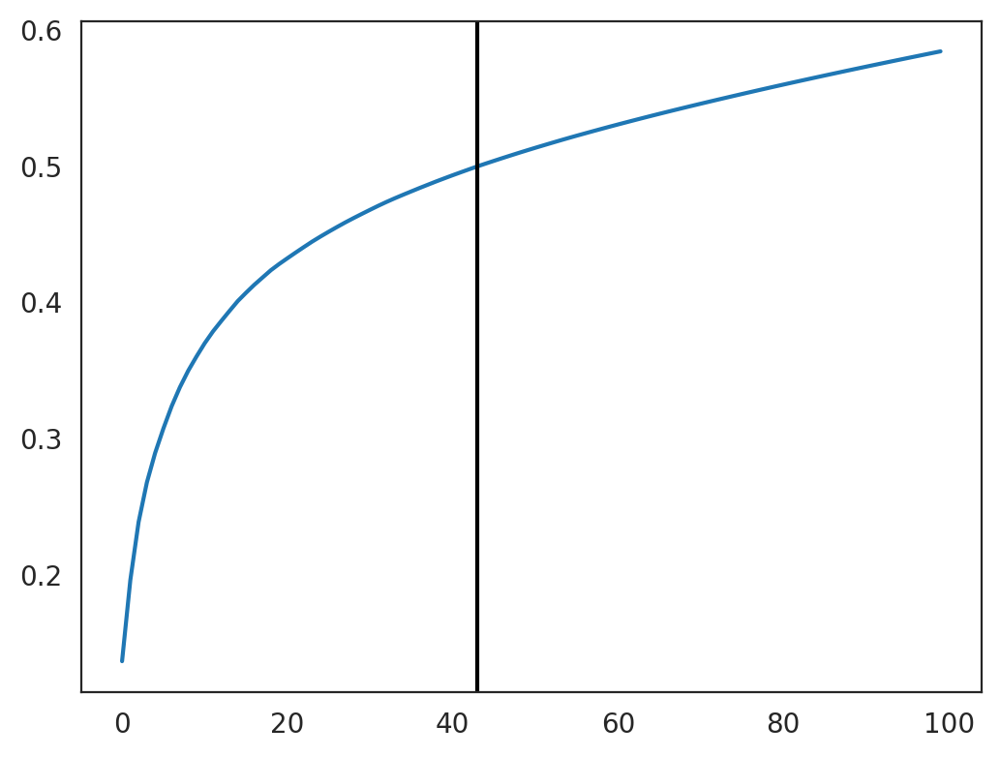

43


In [54]:
# Perform PCA
ctrl_oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(ctrl_oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(ctrl_oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

In [55]:
n_cell = ctrl_oracle.adata.shape[0]
print(f"cell number is :{n_cell}")
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

cell number is :3256
Auto-selected k is :81


In [56]:
ctrl_oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

In [57]:
# Save oracle object.
ctrl_oracle.to_hdf5("jinlab/ctxobj.ctrl_amended.subclass.celloracle.oracle")

In [5]:
ctrl_oracle = co.load_hdf5("jinlab/ctxobj.ctrl.subclass.celloracle.oracle")

In [58]:
%%time
# Calculate GRN for each population in "louvain_annot" clustering unit.
# This step may take some time.(~30 minutes)
ctrl_links = ctrl_oracle.get_links(cluster_name_for_GRN_unit="predicted.subclass", alpha=10,
                         verbose_level=10)

  0%|          | 0/31 [00:00<?, ?it/s]

Inferring GRN for Astro...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for CA2...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for CR...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for CT SUB...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Car3...


  0%|          | 0/1542 [00:00<?, ?it/s]

/gpfs/home/asun/miniforge3/envs/celloracle/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Inferring GRN for L2 IT ENTl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2 IT RHP...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT CTX-1...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT CTX-2...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT ENTl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L2/3 IT PPP...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L3 IT ENT...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L4/5 IT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 IT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 IT TPE-ENT...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 NP CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L5 PT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6 CT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6 IT CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6 IT ENTl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6b CTX...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for L6b/CT ENT...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Lamp5...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for NP PPP...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for NP SUB...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Oligo...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Pvalb...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Sncg...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Sst...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Sst Chodl...


  0%|          | 0/1542 [00:00<?, ?it/s]

Inferring GRN for Vip...


  0%|          | 0/1542 [00:00<?, ?it/s]

/gpfs/home/asun/miniforge3/envs/celloracle/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


CPU times: user 1h 43min 47s, sys: 57.4 s, total: 1h 44min 44s
Wall time: 1h 49min 8s


In [64]:
ctrl_links.to_hdf5(file_path="jinlab/links.ctrl_amended.subclasses.celloracle.links")

In [ ]:
oracle.to_hdf5("jinlab/ctxobj.subclass.celloracle.oracle")

# WT VS SCREEN IN SILICO PETURB

In [4]:
oracle = co.load_hdf5("jinlab/ctxobj.subclass.celloracle.oracle")

In [6]:
oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 11471
    n_genes: 2000
    cluster_name: predicted.subclass
    dimensional_reduction_name: X_umap
    n_target_genes_in_TFdict: 21256 genes
    n_regulatory_in_TFdict: 1093 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 153 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 1542 genes
    k_for_knn_imputation: 286
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [5]:
ctrl_oracle = co.load_hdf5("jinlab/ctxobj.ctrl_amended.subclass.celloracle.oracle")

In [7]:
ctrl_oracle

Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 3256
    n_genes: 2000
    cluster_name: predicted.subclass
    dimensional_reduction_name: X_umap
    n_target_genes_in_TFdict: 21256 genes
    n_regulatory_in_TFdict: 1093 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 153 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 1542 genes
    k_for_knn_imputation: 81
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [8]:
ctrl_links = co.load_hdf5("jinlab/links.ctrl_amended.subclasses.celloracle.links")

In [9]:
links = co.load_hdf5("jinlab/links.subclasses.celloracle.links")

In [10]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, 
                              GRN_unit="cluster",
                              use_cluster_specific_TFdict=True)

  0%|          | 0/34 [00:00<?, ?it/s]

In [11]:
ctrl_links.filter_links()
ctrl_oracle.get_cluster_specific_TFdict_from_Links(links_object=ctrl_links)
ctrl_oracle.fit_GRN_for_simulation(alpha=10, 
                              GRN_unit="cluster",
                              use_cluster_specific_TFdict=True)

  0%|          | 0/31 [00:00<?, ?it/s]

In [15]:
oracle.to_hdf5("jinlab/ctxobj.subclass.calculated.celloracle.oracle")

In [16]:
ctrl_oracle.to_hdf5("jinlab/ctxobj.ctrl.subclass.calculated.celloracle.oracle")

In [17]:
goi = "Tbr1"

# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={goi: 0.0},
                      GRN_unit="cluster",
                      n_propagation=3)

# Enter perturbation conditions to simulate signal propagation after the perturbation.
ctrl_oracle.simulate_shift(perturb_condition={goi: 0.0},
                           GRN_unit="cluster",
                           n_propagation=3)

In [29]:
mock_oracle = oracle.adata.copy()
mock_ctrl = ctrl_oracle.adata.copy()
filtered_oracle = mock_oracle[mock_ctrl.obs_names].copy()


In [43]:
mock_ctrl.obs['predicted.subclass'].value_counts()

L6 CT CTX        964
CR               350
L6 IT CTX        304
L5 NP CTX        222
L5 IT CTX        178
L5 IT TPE-ENT    171
L5 PT CTX        136
Sst              135
Pvalb            129
L2/3 IT CTX-1    110
L2 IT ENTl       110
L6b/CT ENT       101
L2/3 IT CTX-2     73
L6b CTX           65
L4/5 IT CTX       58
NP SUB            34
Car3              30
L6 IT ENTl        26
Sncg              14
L2/3 IT ENTl      12
Lamp5              8
Vip                6
L2 IT RHP          5
L3 IT ENT          4
L2/3 IT PPP        3
Oligo              2
CT SUB             2
CA2                1
NP PPP             1
Sst Chodl          1
Astro              1
Name: predicted.subclass, dtype: int64

# Fold Change and Graphs

In [5]:
oracle = co.load_hdf5("jinlab/ctxobj.subclass.calculated.celloracle.oracle")
ctrl_oracle = co.load_hdf5("jinlab/ctxobj.ctrl.subclass.calculated.celloracle.oracle")

In [6]:
goi = "Tbr1"

# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={goi: 0.0},
                      GRN_unit="cluster",
                      n_propagation=3)

# Enter perturbation conditions to simulate signal propagation after the perturbation.
ctrl_oracle.simulate_shift(perturb_condition={goi: 0.0},
                           GRN_unit="cluster",
                           n_propagation=3)

In [7]:
mock_oracle = oracle.adata.copy()
mock_ctrl = ctrl_oracle.adata.copy()
filtered_oracle = mock_oracle[mock_ctrl.obs_names].copy()

In [8]:
mock_ctrl_input = mock_ctrl.copy()
mock_ctrl_count = mock_ctrl.copy()
mock_ctrl_input.X = mock_ctrl_input.layers["simulation_input"].copy()
mock_ctrl_count.X = mock_ctrl_count.layers["simulated_count"].copy()

filtered_oracle_input = filtered_oracle.copy()
filtered_oracle_count = filtered_oracle.copy()
filtered_oracle_input.X = filtered_oracle_input.layers["simulation_input"].copy()
filtered_oracle_count.X = filtered_oracle_count.layers["simulated_count"].copy()

In [9]:
# Assuming 'adata' is your AnnData object and clusters are identified
# 'cluster_key' is the key in adata.obs that contains cluster labels
# 'cluster_1' and 'cluster_2' are the cluster labels you want to compare

cluster_2_cells = mock_ctrl_input[mock_ctrl_input.obs['predicted.subclass'] == 'L6 CT CTX']
cluster_1_cells = mock_ctrl_count[mock_ctrl_count.obs['predicted.subclass'] == 'L6 CT CTX']

# Calculate mean expression for each gene in both clusters
mean_expression_cluster_1 = cluster_1_cells.X.mean(axis=0)
mean_expression_cluster_2 = cluster_2_cells.X.mean(axis=0)

pseudocount = 1e-6 
fold_change = (mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount)
log_fold_change = np.log2((mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount))

# Convert to a DataFrame for easy viewing
genes = cluster_1_cells.var_names
fold_change_df1 = pd.DataFrame({
    'Gene': genes,
    'Control_Fold_Change': fold_change,
    'Control_Log2_Fold_Change': log_fold_change
})

# Sort by fold change or log fold change
fold_change_df1 = fold_change_df1.sort_values(by='Control_Fold_Change', ascending=False)

In [27]:
fold_change_df1

,Gene,Control_Fold_Change,Control_Log2_Fold_Change
190,Tbr1,1.230171e+06,20.230427
1417,Traf3,8.636517e+00,3.110450
341,Fstl5,2.611426e+00,1.384838
1194,Kitl,1.513835e+00,0.598208
1428,Adarb2,1.474992e+00,0.560707
...,...,...,...
1508,Cartpt,6.639926e-01,-0.590761
423,Pou3f2,6.510425e-01,-0.619176
373,Ntng1,6.051804e-01,-0.724563
728,Plxnd1,4.900825e-01,-1.028904


In [19]:
# Assuming 'adata' is your AnnData object and clusters are identified
# 'cluster_key' is the key in adata.obs that contains cluster labels
# 'cluster_1' and 'cluster_2' are the cluster labels you want to compare

cluster_2_cells = filtered_oracle_input[filtered_oracle_input.obs['predicted.subclass'] == 'L6 CT CTX']
cluster_1_cells = filtered_oracle_count[filtered_oracle_count.obs['predicted.subclass'] == 'L6 CT CTX']

# Calculate mean expression for each gene in both clusters
mean_expression_cluster_1 = cluster_1_cells.X.mean(axis=0)
mean_expression_cluster_2 = cluster_2_cells.X.mean(axis=0)

pseudocount = 1e-6 
fold_change = (mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount)
log_fold_change = np.log2((mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount))

# Convert to a DataFrame for easy viewing
genes = cluster_1_cells.var_names
fold_change_df2 = pd.DataFrame({
    'Gene': genes,
    'Treatment_Fold_Change': fold_change,
    'Treatment_Log2_Fold_Change': log_fold_change
})

# Sort by fold change or log fold change
fold_change_df2 = fold_change_df2.sort_values(by='Treatment_Fold_Change', ascending=False)

In [20]:
fold_change_df2

,Gene,Treatment_Fold_Change,Treatment_Log2_Fold_Change
145,C1ql3,1.483002e+01,3.890449
1962,Slc16a2,2.965622e+00,1.568335
1971,Il1rapl2,2.823773e+00,1.497624
728,Plxnd1,2.685600e+00,1.425244
1661,Cpne8,1.737251e+00,0.796806
...,...,...,...
1577,Pcdh20,5.426189e-01,-0.881989
624,Cux1,3.907594e-01,-1.355648
341,Fstl5,3.751197e-01,-1.414577
1417,Traf3,2.185326e-01,-2.194079


In [29]:
result = pd.merge(fold_change_df1, fold_change_df2, on="Gene", how="inner")
result = result[result['Gene'] != 'Tbr1']

In [30]:
result

,Gene,Control_Fold_Change,Control_Log2_Fold_Change,Treatment_Fold_Change,Treatment_Log2_Fold_Change
1,Traf3,8.636517,3.110450,4.575975,2.194079
2,Fstl5,2.611426,1.384838,2.665816,1.414577
3,Kitl,1.513835,0.598208,0.910197,-0.135750
4,Adarb2,1.474992,0.560707,1.480259,0.565850
5,Sphkap,1.408924,0.494594,0.743489,-0.427616
...,...,...,...,...,...
1995,Cartpt,0.663993,-0.590761,0.994980,-0.007260
1996,Pou3f2,0.651042,-0.619176,0.861959,-0.214309
1997,Ntng1,0.605180,-0.724563,0.625935,-0.675916
1998,Plxnd1,0.490082,-1.028904,0.372356,-1.425244


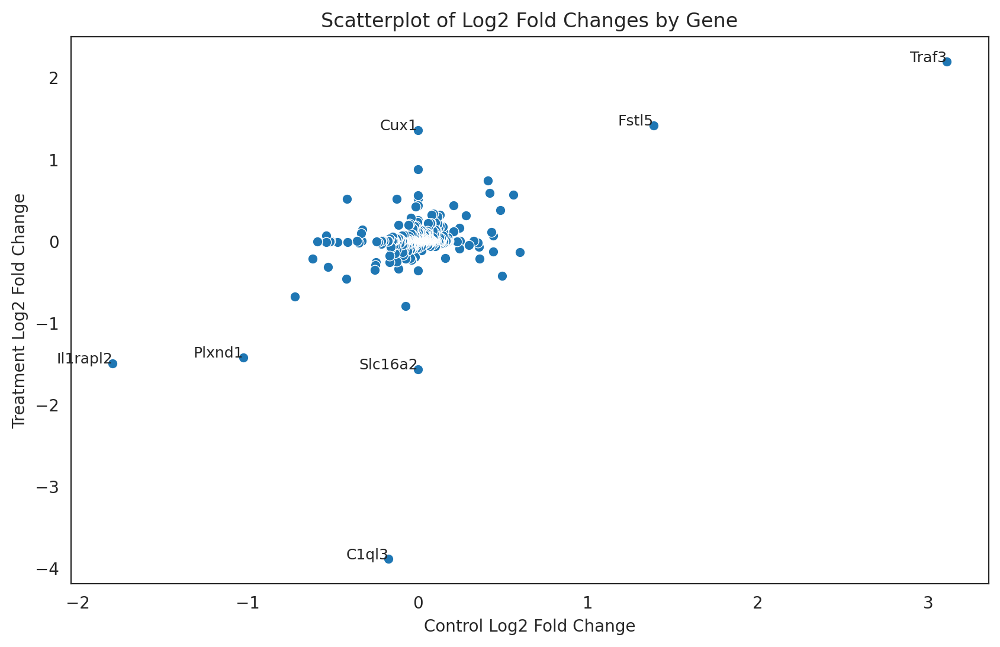

In [61]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=result, x='Control_Log2_Fold_Change', y='Treatment_Log2_Fold_Change')

for i in range(1, len(result)+1):
    x_val = result['Control_Log2_Fold_Change'][i]
    y_val = result['Treatment_Log2_Fold_Change'][i]
    if abs(x_val) > 1 or abs(y_val) > 1:
        plt.text(
            x_val, 
            y_val, 
            result['Gene'][i],
            fontsize=9,
            ha='right'  # horizontal alignment
        )
        
# Add labels and title
plt.xlabel('Control Log2 Fold Change')
plt.ylabel('Treatment Log2 Fold Change')
plt.title('Scatterplot of Log2 Fold Changes by Gene')

# Display the plot
plt.show()

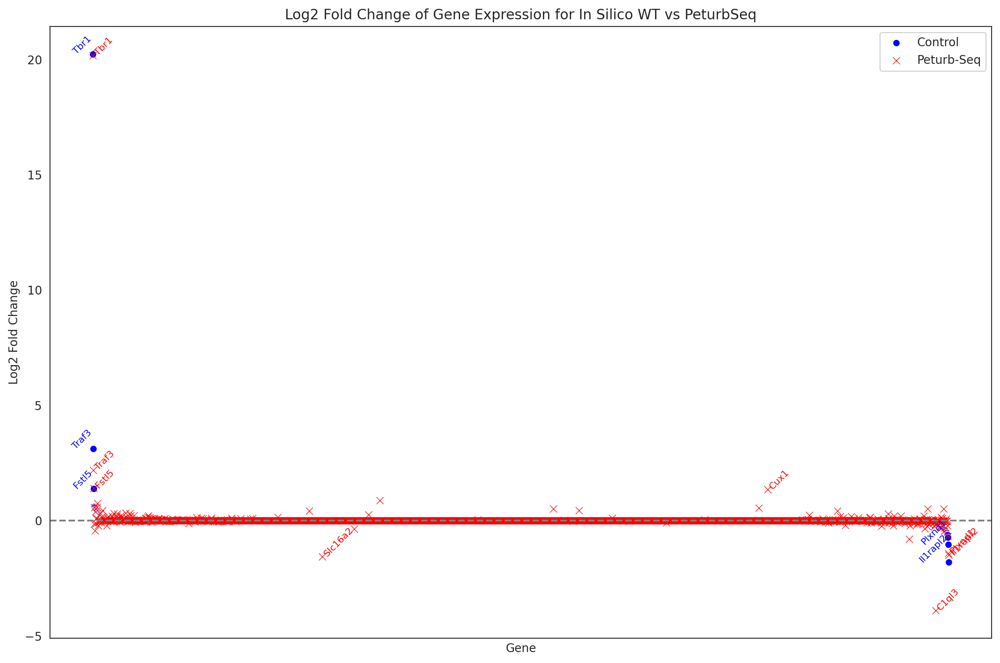

In [63]:
plt.figure(figsize=(12, 8))

# Plot the first DataFrame
sns.scatterplot(data=fold_change_df1, x='Gene', y='Log2_Fold_Change', label='Control', color='blue', marker='o')

# Plot the second DataFrame
sns.scatterplot(data=fold_change_df2, x='Gene', y='Log2_Fold_Change', label='Peturb-Seq', color='red', marker='x')

# Customize plot
plt.axhline(0, color='gray', linestyle='--')  # Horizontal line at log2 fold change = 0
plt.xlabel('Gene')
plt.ylabel('Log2 Fold Change')
plt.title('Log2 Fold Change of Gene Expression for In Silico WT vs PeturbSeq')

# Add gene names as labels if fold change > 1 or < -1 for the first DataFrame
for i in range(fold_change_df1.shape[0]):
    if abs(fold_change_df1['Log2_Fold_Change'].iloc[i]) > 1:
        plt.text(
            x=fold_change_df1['Gene'].iloc[i],
            y=fold_change_df1['Log2_Fold_Change'].iloc[i],
            s=fold_change_df1['Gene'].iloc[i],
            color='blue',
            fontsize=8,
            ha='right',
            rotation=45  # Rotate the label for better readability
        )

# Add gene names as labels if fold change > 1 or < -1 for the second DataFrame
for i in range(fold_change_df2.shape[0]):
    if abs(fold_change_df2['Log2_Fold_Change'].iloc[i]) > 1:
        plt.text(
            x=fold_change_df2['Gene'].iloc[i],
            y=fold_change_df2['Log2_Fold_Change'].iloc[i],
            s=fold_change_df2['Gene'].iloc[i],
            color='red',
            fontsize=8,
            ha='left',
            rotation=45  # Rotate the label for better readability
        )


plt.xticks([])

# Add a legend to differentiate the two plots
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(12, 8))

# Plot the first DataFrame
sns.scatterplot(x=fold_change_df1.index, data=fold_change_df1, y='Log2_Fold_Change', label='Cluster 1 vs 2', color='blue', marker='o')

# Plot the second DataFrame
sns.scatterplot(x=fold_change_df2.index, data=fold_change_df2, y='Log2_Fold_Change', label='Cluster 3 vs 4', color='red', marker='x')

# Customize plot
plt.axhline(0, color='gray', linestyle='--')  # Horizontal line at log2 fold change = 0
plt.xticks(rotation=90)  # Rotate gene names if necessary
plt.xlabel('Gene')
plt.ylabel('Log2 Fold Change')
plt.title('Log2 Fold Change of Gene Expression Between Two Comparisons')

# Add a legend to differentiate the two plots
plt.legend()

plt.tight_layout()
plt.show()

In [31]:
#oracle.adata.obs['assignDS'].value_counts()

In [32]:
#peturb

In [35]:
#oracle.adata.to_df()

In [36]:
peturb = oracle.adata.copy()

In [38]:
#peturb.obs['assignDS']

In [39]:
control = ['NonTarget1', 'NonTarget2', 'SafeTarget', 'GFP']
peturb_ctrl = peturb[peturb.obs['assignDS'].isin(control)].copy()

treatment = ['Tbr1_1', 'Tbr1_2', 'Tbr1_3']
peturb_tm = peturb[peturb.obs['assignDS'].isin(treatment)].copy()

foxg1 = ['Foxg1_1', 'Foxg1_2', 'Foxg1_3']
peturb_foxg1 = peturb[peturb.obs['assignDS'].isin(foxg1)].copy()

In [40]:
column_labels = oracle.adata.var_names.tolist()
#ctrl_adata = ctrl_adata[:, ctrl_adata.var_names.isin(column_labels)]


In [41]:
peturb_ctrl = peturb_ctrl[:, peturb_ctrl.var_names.isin(column_labels)]
peturb_tm = peturb_tm[:, peturb_tm.var_names.isin(column_labels)]


In [42]:
#peturb_ctrl

In [44]:
#peturb_tm.obs['predicted.subclass'].value_counts()

In [45]:
# Assuming 'adata' is your AnnData object and clusters are identified
# 'cluster_key' is the key in adata.obs that contains cluster labels
# 'cluster_1' and 'cluster_2' are the cluster labels you want to compare

cluster_1_cells = peturb_foxg1[peturb_foxg1.obs['predicted.subclass'] == 'L6 CT CTX']
cluster_2_cells = peturb_ctrl[peturb_ctrl.obs['predicted.subclass'] == 'L6 CT CTX']

# Calculate mean expression for each gene in both clusters
mean_expression_cluster_1 = cluster_1_cells.X.mean(axis=0).A1
mean_expression_cluster_2 = cluster_2_cells.X.mean(axis=0).A1

pseudocount = 1e-6 
fold_change = (mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount)
log_fold_change = np.log2((mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount))

# Convert to a DataFrame for easy viewing
genes = cluster_1_cells.var_names


In [46]:
#cluster_1_cells.to_df()

In [47]:
#cluster_2_cells.to_df()

In [48]:
fold_change_df3 = pd.DataFrame({
    'Gene': genes,
    'Fold_Change': fold_change,
    'Log2_Fold_Change': log_fold_change
})

# Sort by fold change or log fold change
fold_change_df3 = fold_change_df3.sort_values(by='Fold_Change', ascending=False)

In [90]:
genes.shape

(2000,)

In [105]:
fold_change[0][0]

matrix([[1.1217244 , 0.51246434, 0.74074805, ..., 0.9972225 , 0.99285984,
         0.9957749 ]], dtype=float32)

In [89]:
log_fold_change.shape

(1, 2000)

In [22]:
fold_change_df3

,Gene,Fold_Change,Log2_Fold_Change
1447,Pxdc1,11324.334961,13.467138
1517,Fst,10469.778320,13.353943
403,Gm10636,6051.575195,12.563095
1641,Mfng,5698.806641,12.476444
1846,1700001G01Rik,4449.524414,12.119435
...,...,...,...
437,Abca1,0.000205,-12.250648
1311,Top2a,0.000198,-12.301984
1467,Syk,0.000198,-12.302293
635,Elfn1,0.000180,-12.436070


In [21]:
fold_change_df2.to_csv('jinlab/fold_change_df2.csv', index=False)

In [23]:
result = fold_change_df3[fold_change_df3['Gene'] == "Foxg1"]

In [24]:
result

,Gene,Fold_Change,Log2_Fold_Change
1369,Foxg1,1.575615,0.655915


2024-08-30 11:39:41,883 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-08-30 11:39:42,329 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-08-30 11:39:42,638 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-08-30 11:39:42,797 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2024-08-30 11:39:42,966 - INFO - Using categorical units to plot a list of strings that are all parsable as 

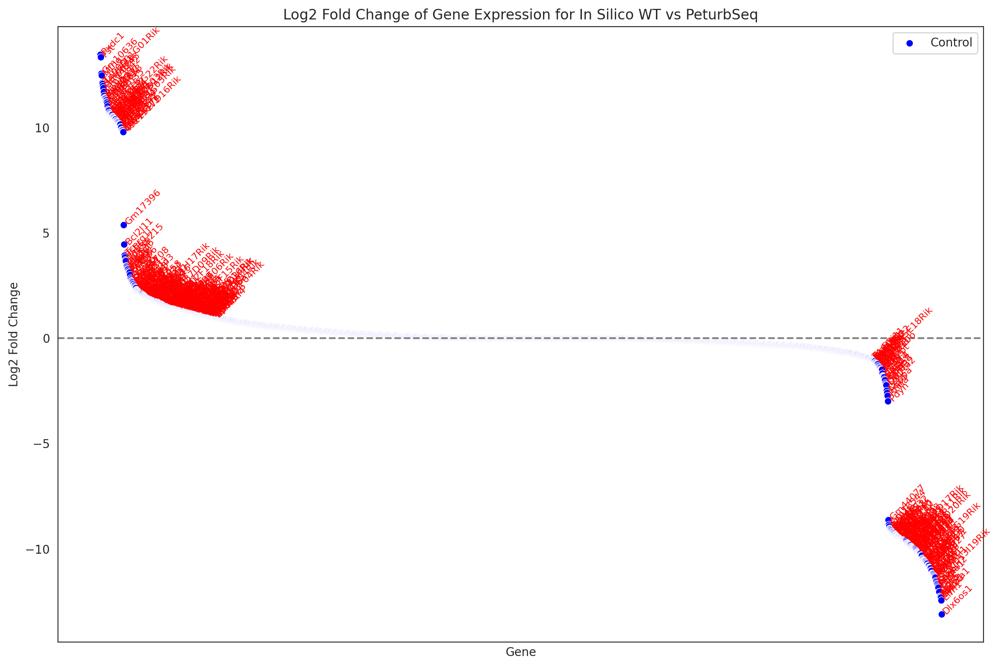

In [25]:
plt.figure(figsize=(12, 8))

# Plot the first DataFrame
sns.scatterplot(data=fold_change_df3, x='Gene', y='Log2_Fold_Change', label='Control', color='blue', marker='o')

# Plot the second DataFrame
# Customize plot
plt.axhline(0, color='gray', linestyle='--')  # Horizontal line at log2 fold change = 0
plt.xlabel('Gene')
plt.ylabel('Log2 Fold Change')
plt.title('Log2 Fold Change of Gene Expression for In Silico WT vs PeturbSeq')


# Add gene names as labels if fold change > 1 or < -1 for the second DataFrame
for i in range(fold_change_df3.shape[0]):
    if abs(fold_change_df3['Log2_Fold_Change'].iloc[i]) > 1:
        plt.text(
            x=fold_change_df3['Gene'].iloc[i],
            y=fold_change_df3['Log2_Fold_Change'].iloc[i],
            s=fold_change_df3['Gene'].iloc[i],
            color='red',
            fontsize=8,
            ha='left',
            rotation=45  # Rotate the label for better readability
        )


plt.xticks([])

# Add a legend to differentiate the two plots
plt.legend()

plt.tight_layout()
plt.show()

In [29]:
df = pd.read_csv('jinlab/edgeR_LRT_with_sva.Tbr1_1.Excit_L6CT_CTX.tsv', sep='\t')
df = df.sort_values(by='logFC', ascending=False)
df


,Unnamed: 0,logFC,logCPM,LR,PValue,padj
3013,Htr5a,24.508745,3.308836,10.995607,0.000913,0.141899
2925,Samd11,20.298857,3.012405,10.317798,0.001318,0.158916
9217,Dock5,19.780338,3.339445,12.692063,0.000367,0.089324
928,Wdr38,18.442324,3.164356,15.098127,0.000102,0.055603
8355,Ptpn21,18.400170,3.736824,12.859942,0.000336,0.085560
...,...,...,...,...,...,...
5723,Sdr42e1,-19.578297,3.342199,8.070758,0.004499,0.233430
4432,Zfp526,-19.728247,3.311996,12.480437,0.000411,0.092027
7301,Slc22a21,-21.619882,3.064217,9.119526,0.002529,0.194796
5088,Fam53b,-28.062619,3.146522,13.819872,0.000201,0.077500


In [65]:
test = df[df['Unnamed: 0'] == 'Tbr1']
test

,Unnamed: 0,logFC,logCPM,LR,PValue,padj
973,Tbr1,-0.732774,7.539583,4.897815,0.026891,0.365995


# DEG analysis reconstruction with EdgeR

In [11]:
df = pd.read_csv('jinlab/tsv/edgeR_LRT_with_sva.Tbr1_1.Excit_L6CT_CTX.tsv', sep='\t')
df_sorted = df.iloc[df['logFC'].abs().argsort()]
df_sorted.set_index('Unnamed: 0')
rows_to_add = df_sorted.loc[df_sorted['Unnamed: 0'] == 'Tbr1']
DEG = df_sorted.tail(3000)
# Adding the selected rows to df2
DEG = pd.concat([DEG, rows_to_add], ignore_index=True)
DEG.set_index("Unnamed: 0")
deg_list = DEG['Unnamed: 0'].tolist()

In [47]:
# Download dataset. You can change the code blow to use your data.
adata = co.data_conversion.seurat_object_to_anndata("jinlab/ctxobj.rds",
                                                    delete_tmp_file=True)

input file name: jinlab/ctxobj.rds


Loading required package: SeuratObject
Loading required package: sp

Attaching package: ‘SeuratObject’

The following objects are masked from ‘package:base’:

    intersect, t

loading seurat object ...
  seurat object version is 4x
Processing an assay: RNA
Processing an assay: Crispr


making AnnData ...
2 assays found in the seurat object.
Data is exported as multiple files.
If the seurat object was made by integrating multiple files, please be careful about 'Simpson's effect' in the inferred GRN.
Go to CellOracle web documentation for detailed information about this issue.


In [48]:
raw_count_layer = adata['RNA'].layers['raw_count']
adata['RNA'].X = raw_count_layer
adata = adata['RNA']

# Only consider genes with more than 1 count
sc.pp.filter_genes(adata, min_counts=1)

# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='nCount_RNA')
adata = adata[:, deg_list]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()

# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

# Load TF info which was made from mouse cell atlas dataset.
base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()

# Instantiate Oracle object
oracle = co.Oracle()

# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="predicted.subclass",
                                   embedding_name="X_umap")

# You can load TF info dataframe with the following code.
oracle.import_TF_data(TF_info_matrix=base_GRN)

# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

# Save oracle object.
oracle.to_hdf5("jinlab/ctxobj.subclass.DEG.celloracle.oracle")

links = oracle.get_links(cluster_name_for_GRN_unit="predicted.subclass", alpha=10,
                         verbose_level=10)

links.to_hdf5(file_path="jinlab/links.subclasses.DEG.celloracle.links")

# FC Graphs and ROC comparison

In [17]:
oracle = co.load_hdf5("jinlab/ctxobj.subclass.DEG.celloracle.oracle")

In [18]:
links = co.load_hdf5("jinlab/links.subclasses.DEG.celloracle.links")

In [19]:
oracle


Oracle object

Meta data
    celloracle version used for instantiation: 0.18.0
    n_cells: 11471
    n_genes: 3001
    cluster_name: predicted.subclass
    dimensional_reduction_name: X_umap
    n_target_genes_in_TFdict: 21256 genes
    n_regulatory_in_TFdict: 1093 genes
    n_regulatory_in_both_TFdict_and_scRNA-seq: 121 genes
    n_target_genes_both_TFdict_and_scRNA-seq: 2368 genes
    k_for_knn_imputation: 286
Status
    Gene expression matrix: Ready
    BaseGRN: Ready
    PCA calculation: Done
    Knn imputation: Done
    GRN calculation for simulation: Not finished

In [20]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, 
                              GRN_unit="cluster",
                              use_cluster_specific_TFdict=True)

  0%|          | 0/34 [00:00<?, ?it/s]

In [21]:
goi = "Tbr1"

# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={goi: 0.46},
                      GRN_unit="cluster",
                      n_propagation=3)

In [22]:
oracle_input = oracle.adata.copy()
oracle_count = oracle.adata.copy()
oracle_input.X = oracle.adata.layers["simulation_input"].copy()
oracle_count.X = oracle.adata.layers["simulated_count"].copy()

In [23]:
oracle_count.to_df()

,Micall1,Usf2,1500015A07Rik,C130026L21Rik,Slc20a2,Ajap1,Pigo,Flrt1,Numb,Prtn3,...,Gpx3,Sdr42e1,Zfp526,Dock5,Samd11,Slc22a21,Htr5a,Fam53b,Lrrc56,Tbr1
Ch1_AAACCTGTCAGGTTCA-1,0.197836,0.278903,0.118082,0.143040,0.121796,0.495773,0.091565,0.067791,0.246587,0.117710,...,0.030197,0.052504,0.019892,0.020913,0.032500,0.037613,0.035287,0.015852,0.031257,0.46
Ch1_AAACCTGTCCTTTACA-1,0.201016,0.263887,0.136557,0.140424,0.118307,0.766447,0.059114,0.076216,0.190796,0.138846,...,0.055398,0.027716,0.036424,0.040437,0.051790,0.057723,0.057672,0.003819,0.031812,0.46
Ch1_AAACGGGCACAGGAGT-1,0.122197,0.245998,0.103588,0.000000,0.282963,0.681849,0.070948,0.063735,0.138375,0.111926,...,0.071470,0.027065,0.029372,0.000000,0.003260,0.006178,0.002761,0.016943,0.013328,0.46
Ch1_AAACGGGCATGCAATC-1,0.202867,0.260216,0.125556,0.077316,0.120894,0.222966,0.085537,0.081044,0.197453,0.175456,...,0.056200,0.033931,0.025689,0.026811,0.029848,0.028008,0.047606,0.008535,0.025550,0.46
Ch1_AAACGGGGTAATAGCA-1,0.125624,0.275441,0.115691,0.165792,0.136585,0.804526,0.112486,0.090191,0.286259,0.142667,...,0.039960,0.044834,0.024334,0.036626,0.060101,0.041289,0.056153,0.017108,0.030768,0.46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ch5_TTTGGTTGTTCACGGC-1,0.129063,0.282092,0.145058,0.036331,0.099423,0.496564,0.057232,0.133823,0.239920,0.113624,...,0.045782,0.034891,0.046586,0.033219,0.017296,0.033511,0.041551,0.058587,0.015782,0.46
Ch5_TTTGGTTTCGAACGGA-1,0.110249,0.236006,0.153960,0.035200,0.264834,0.307087,0.063057,0.097039,0.245298,0.118293,...,0.038614,0.012856,0.048324,0.004314,0.019170,0.027925,0.046252,0.017838,0.027983,0.46
Ch5_TTTGGTTTCTTTACGT-1,0.216298,0.274296,0.107263,0.099440,0.127276,0.605668,0.105879,0.043136,0.153254,0.162717,...,0.057931,0.024263,0.039114,0.081080,0.054333,0.034131,0.068918,0.012399,0.035378,0.46
Ch5_TTTGTCAGTTGACGTT-1,0.100872,0.221719,0.124483,0.000000,0.272637,0.568069,0.061581,0.043880,0.110374,0.115047,...,0.089519,0.017087,0.026781,0.000000,0.003260,0.010083,0.000000,0.022157,0.013052,0.46


In [24]:
# Assuming 'adata' is your AnnData object and clusters are identified
# 'cluster_key' is the key in adata.obs that contains cluster labels
# 'cluster_1' and 'cluster_2' are the cluster labels you want to compare

cluster_1_cells = oracle_count[oracle_count.obs['predicted.subclass'] == 'L6 CT CTX']
cluster_2_cells = oracle_input[oracle_input.obs['predicted.subclass'] == 'L6 CT CTX']

# Calculate mean expression for each gene in both clusters
mean_expression_cluster_1 = cluster_1_cells.X.mean(axis=0)
mean_expression_cluster_2 = cluster_2_cells.X.mean(axis=0)

pseudocount = 1e-6 
fold_change = (mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount)
log_fold_change = np.log2((mean_expression_cluster_1 + pseudocount) / (mean_expression_cluster_2 + pseudocount))

# Convert to a DataFrame for easy viewing
genes = cluster_1_cells.var_names
fold_change_df1 = pd.DataFrame({
    'Gene': genes,
    'Control_Fold_Change': fold_change,
    'Control_Log2_Fold_Change': log_fold_change
})

# Sort by fold change or log fold change
fold_change_df1 = fold_change_df1.sort_values(by='Control_Fold_Change', ascending=False)

In [25]:
df = pd.read_csv('jinlab/edgeR_LRT_with_sva.Tbr1_1.Excit_L6CT_CTX.tsv', sep='\t')
df = df.sort_values(by='logFC', ascending=False)
df_sorted = df.iloc[df['logFC'].abs().argsort()]

In [26]:
rows_to_add = df_sorted.loc[df_sorted['Unnamed: 0'] == 'Tbr1']

In [27]:
DEG = df_sorted.tail(3000)

In [28]:
# Adding the selected rows to df2
DEG = pd.concat([DEG, rows_to_add], ignore_index=True)

In [29]:
DEG.rename(columns={'Unnamed: 0': 'Gene'}, inplace=True)
DEG

,Gene,logFC,logCPM,LR,PValue,padj
0,Micall1,2.078605,5.115047,2.352741,0.125063,0.567177
1,Usf2,-2.079332,5.535160,1.922598,0.165571,0.618080
2,1500015A07Rik,-2.080297,4.820156,0.447164,0.503685,0.857132
3,C130026L21Rik,2.080513,3.957751,0.532251,0.465662,0.830555
4,Slc20a2,2.082784,5.354641,1.460552,0.226842,0.678028
...,...,...,...,...,...,...
2996,Slc22a21,-21.619882,3.064217,9.119526,0.002529,0.194796
2997,Htr5a,24.508745,3.308836,10.995607,0.000913,0.141899
2998,Fam53b,-28.062619,3.146522,13.819872,0.000201,0.077500
2999,Lrrc56,-29.366228,3.132661,15.426243,0.000086,0.055603


In [30]:
result = pd.merge(fold_change_df1, DEG, on="Gene", how="inner")
#result = result[result['Gene'] != 'Tbr1']
result = result[result['Control_Log2_Fold_Change'] != 0]


In [31]:
result

,Gene,Control_Fold_Change,Control_Log2_Fold_Change,logFC,logCPM,LR,PValue,padj
0,C1ql3,6.403140,2.678780,-12.831547,3.267026,11.219583,0.000809,0.132396
1,Stxbp6,2.493841,1.318370,2.087715,5.694808,3.343997,0.067451,0.473755
2,Rnf39,1.538432,0.621461,4.193000,3.497060,1.717083,0.190069,0.641904
3,Acy1,1.496591,0.581680,-4.148818,4.116775,2.046892,0.152517,0.601880
4,Ppfibp1,1.486052,0.571484,3.007069,5.369804,2.772462,0.095899,0.526010
...,...,...,...,...,...,...,...,...
2996,Tbr1,0.377572,-1.405178,-0.732774,7.539583,4.897815,0.026891,0.365995
2997,Acp6,0.273680,-1.869437,-3.214811,4.261883,1.035567,0.308855,0.733798
2998,Lin28b,0.248689,-2.007588,-3.535018,3.927931,1.245141,0.264483,0.706538
2999,Cwh43,0.220547,-2.180841,-4.512919,3.239916,0.788308,0.374612,0.781086


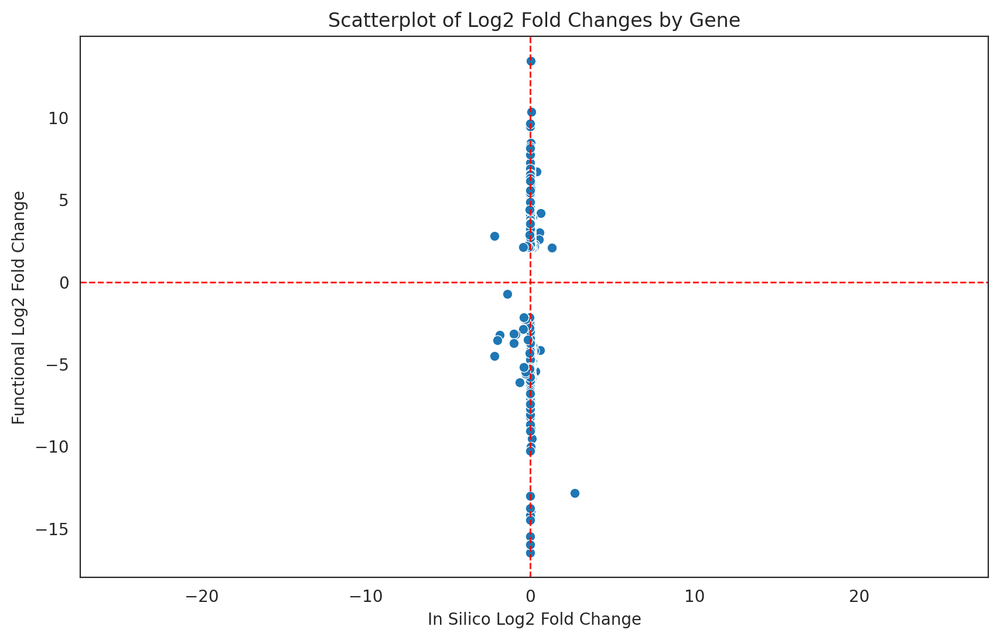

In [32]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=result, x='Control_Log2_Fold_Change', y='logFC')

"""
for i in range(1, len(result)):
    x_val = result['Control_Log2_Fold_Change'][i]
    y_val = result['logFC'][i]
    if abs(x_val) > 1 or abs(y_val) > 1:
        plt.text(
            x_val, 
            y_val, 
            result['Gene'][i],
            fontsize=9,
            ha='right'  # horizontal alignment
        )
"""

# Add labels and title
plt.xlabel('In Silico Log2 Fold Change')
plt.ylabel('Functional Log2 Fold Change')
plt.xticks()
plt.yticks()
plt.title('Scatterplot of Log2 Fold Changes by Gene')

plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
plt.axhline(y=0, color='red', linestyle='--', linewidth=1)
plt.axis('equal')


# Display the plot
plt.show()

In [19]:
## TODO AUROC CURVE

In [20]:
from sklearn.metrics import confusion_matrix, roc_auc_score

# Example arrays (logFC for in silico and functional perturbations)
# Positive logFC classified as 1, negative as 0
in_silico_fc = result['Control_Log2_Fold_Change']  # LogFC from in silico perturbations
functional_fc = result['logFC']  # LogFC from functional perturbations

# Convert logFC to binary classifications (1 = positive, 0 = negative)
in_silico_class = [1 if fc > 0 else 0 for fc in in_silico_fc]
functional_class = [1 if fc > 0 else 0 for fc in functional_fc]

# Create confusion matrix
tn, fp, fn, tp = confusion_matrix(functional_class, in_silico_class).ravel()
print(f"Confusion Matrix: TP = {tp}, FP = {fp}, TN = {tn}, FN = {fn}")

# Approximate AUROC score
# If we had continuous values for in silico predictions, we could use roc_auc_score directly
# For binary classification, we calculate AUROC based on the classes:
auc_score = roc_auc_score(functional_class, in_silico_class)
print(f"AUC: {auc_score}")


Confusion Matrix: TP = 129, FP = 244, TN = 253, FN = 90
AUC: 0.5490477109230727


AUC: 0.541726916733756


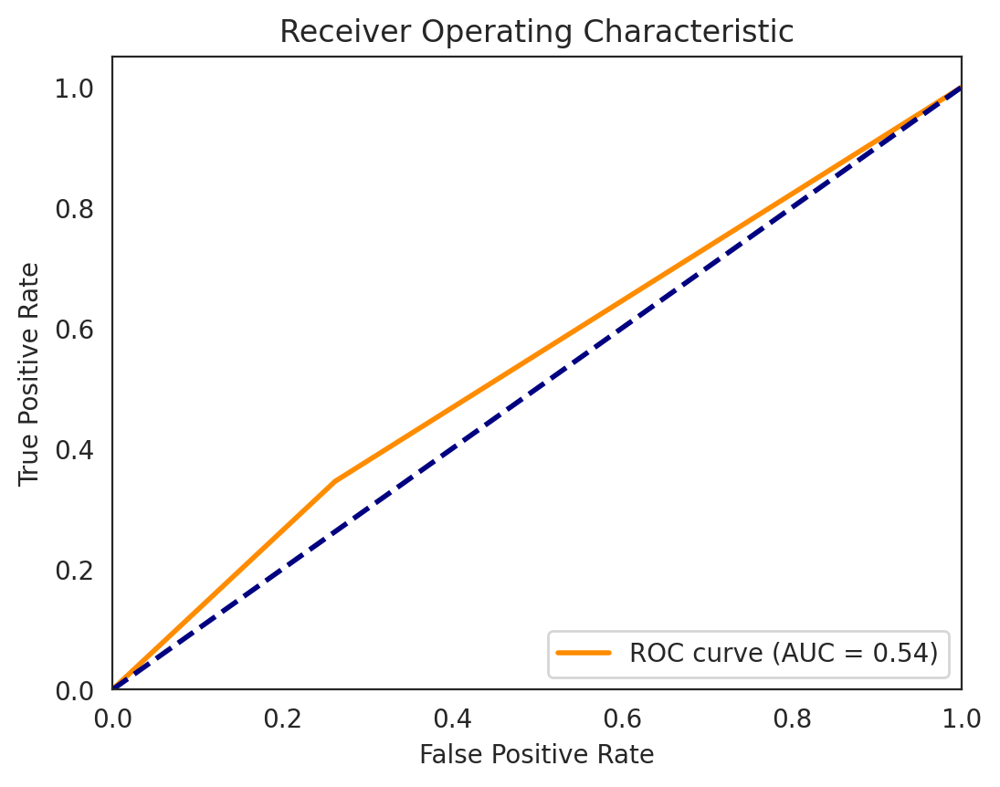

In [21]:
# Import necessary libraries
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming:
# - true_labels: A binary array from the functional perturbation matrix (1 for significant perturbation, 0 for non-significant)
# - predicted_scores: A continuous array from the in silico perturbation matrix (predicted values)

# Example arrays
# true_labels = [0, 1, 1, 0, 1, 0, 1, 1]  # Binary true labels
# predicted_scores = [0.1, 0.4, 0.35, 0.8, 0.7, 0.2, 0.9, 0.85]  # Continuous predicted scores

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(in_silico_class, functional_class)

# Calculate the AUC
roc_auc = auc(fpr, tpr)
print(f"AUC: {roc_auc}")

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Reference line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [25]:
links = co.load_hdf5("jinlab/GRN.L6_CT_CTX_Glut.celloracle.links")

In [26]:
links

In [27]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, 
                              GRN_unit="cluster",
                              use_cluster_specific_TFdict=True)

ValueError: Clustering unit does not match. Please prepare links object that was made with same cluster data.

In [6]:
fold_change_df1 = pd.read_csv("jinlab/fold_change_df1.csv")
fold_change_df2 = pd.read_csv("jinlab/fold_change_df2.csv")
fold_change_df3 = pd.read_csv("jinlab/fold_change_df3.csv")

In [7]:
# Merging the three DataFrames on the 'gene' column
df_merged = pd.merge(fold_change_df1, fold_change_df2, on='Gene', how='inner')  # first merge df1 and df2
df_merged = pd.merge(df_merged, fold_change_df3, on='Gene', how='inner')  # then merge with df3

df_merged

,Gene,Control_Fold_Change,Control_Log2_Fold_Change,Treatment_Fold_Change,Treatment_Log2_Fold_Change,Fold_Change,Log2_Fold_Change
0,Il1rapl2,3.474710e+00,1.796892,2.823773e+00,1.497624,1.105185,0.144288
1,Plxnd1,2.040473e+00,1.028904,2.685600e+00,1.425244,1.455460,0.541475
2,Ntng1,1.652400e+00,0.724563,1.597611e+00,0.675916,1.417086,0.502927
3,Pou3f2,1.535998e+00,0.619176,1.160148e+00,0.214309,1.246412,0.317781
4,Cartpt,1.506041e+00,0.590761,1.005045e+00,0.007260,1.017702,0.025314
...,...,...,...,...,...,...,...
1995,Adarb2,6.779698e-01,-0.560707,6.755574e-01,-0.565850,0.938198,-0.092035
1996,Kitl,6.605741e-01,-0.598208,1.098664e+00,0.135750,0.838824,-0.253559
1997,Fstl5,3.829326e-01,-1.384838,3.751197e-01,-1.414577,0.953563,-0.068600
1998,Traf3,1.157874e-01,-3.110450,2.185326e-01,-2.194079,0.936541,-0.094586


In [8]:
from sklearn.metrics import confusion_matrix, roc_auc_score

# Example arrays (logFC for in silico and functional perturbations)
# Positive logFC classified as 1, negative as 0
ctrl_fc = df_merged['Control_Log2_Fold_Change']  # LogFC from in silico perturbations
perturb_fc = df_merged['Treatment_Log2_Fold_Change']
functional_fc = df_merged['Log2_Fold_Change']  # LogFC from functional perturbations

# Convert logFC to binary classifications (1 = positive, 0 = negative)

ctrl_class = [1 if fc > 0 else 0 for fc in ctrl_fc]
perturb_class = [1 if fc > 0 else 0 for fc in perturb_fc]
functional_class = [1 if fc > 0 else 0 for fc in functional_fc]

# Create confusion matrix
ctrl_tn, ctrl_fp, ctrl_fn, ctrl_tp = confusion_matrix(functional_class, ctrl_class).ravel()
perturb_tn, perturb_fp, perturb_fn, perturb_tp = confusion_matrix(functional_class, perturb_class).ravel()
#print(f"Confusion Matrix: TP = {tp}, FP = {fp}, TN = {tn}, FN = {fn}")

# Approximate AUROC score
# If we had continuous values for in silico predictions, we could use roc_auc_score directly
# For binary classification, we calculate AUROC based on the classes:
#auc_score = roc_auc_score(functional_class, in_silico_class)
#print(f"AUC: {auc_score}")


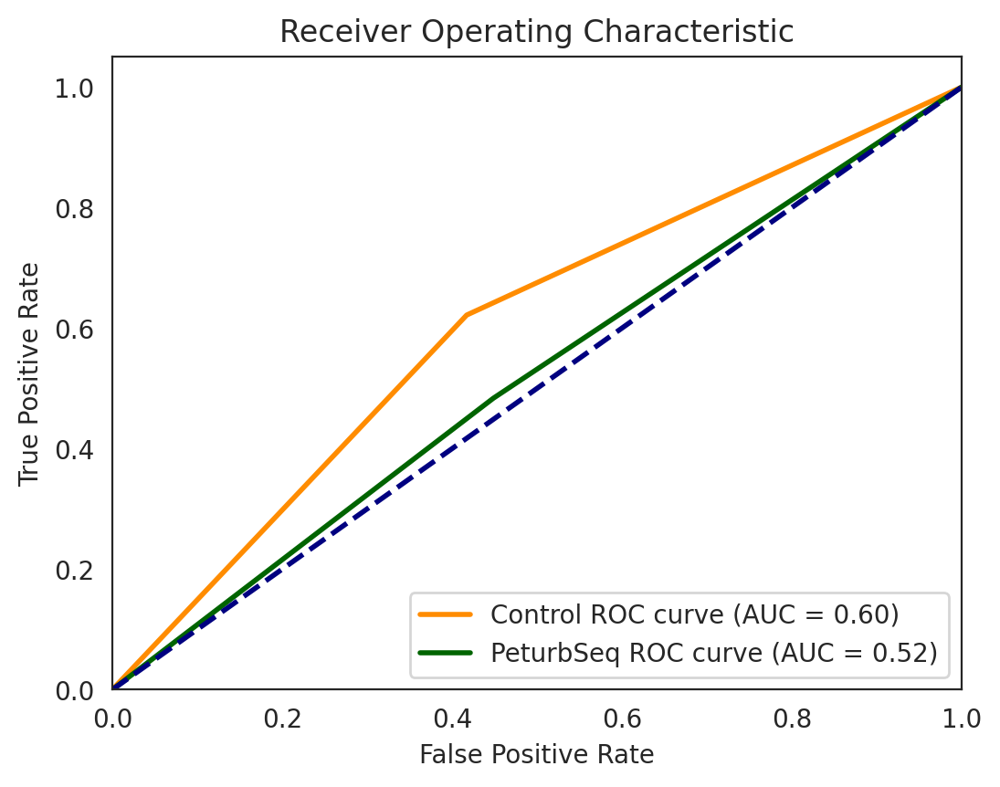

In [10]:
# Import necessary libraries
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming:
# - true_labels: A binary array from the functional perturbation matrix (1 for significant perturbation, 0 for non-significant)
# - predicted_scores: A continuous array from the in silico perturbation matrix (predicted values)

# Example arrays
# true_labels = [0, 1, 1, 0, 1, 0, 1, 1]  # Binary true labels
# predicted_scores = [0.1, 0.4, 0.35, 0.8, 0.7, 0.2, 0.9, 0.85]  # Continuous predicted scores

# Calculate the ROC curve
ctrl_fpr, ctrl_tpr, ctrl_thresholds = roc_curve(ctrl_class, functional_class)
perturb_fpr, perturb_tpr, perturb_thresholds = roc_curve(perturb_class, functional_class)


# Calculate the AUC
ctrl_roc_auc = auc(ctrl_fpr, ctrl_tpr)
perturb_roc_auc = auc(perturb_fpr, perturb_tpr)

#print(f"AUC: {roc_auc}")

# Plot the ROC curve
plt.figure()
plt.plot(ctrl_fpr, ctrl_tpr, color='darkorange', lw=2, label=f'Control ROC curve (AUC = {ctrl_roc_auc:.2f})')
plt.plot(perturb_fpr, perturb_tpr, color='darkgreen', lw=2, label=f'PeturbSeq ROC curve (AUC = {perturb_roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Reference line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.savefig("jinlab/ctrl_peturb_auroc.jpg")

In [14]:
df_merged = df_merged[df_merged['Gene'] != 'Tbr1']


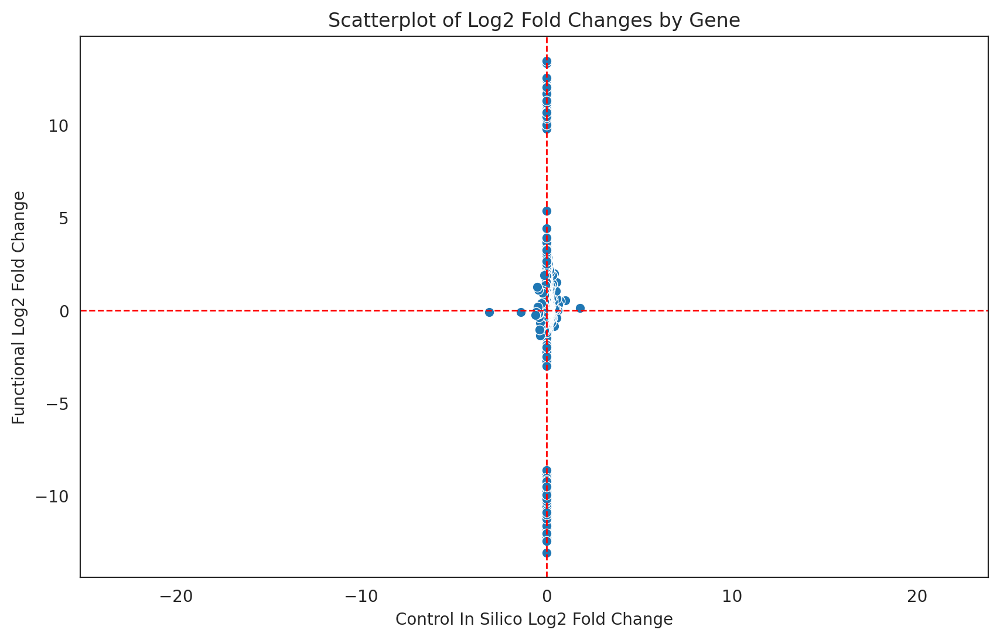

In [36]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_merged, x='Control_Log2_Fold_Change', y='Log2_Fold_Change')

"""
for i in range(1, len(result)):
    x_val = result['Control_Log2_Fold_Change'][i]
    y_val = result['logFC'][i]
    if abs(x_val) > 1 or abs(y_val) > 1:
        plt.text(
            x_val, 
            y_val, 
            result['Gene'][i],
            fontsize=9,
            ha='right'  # horizontal alignment
        )
"""

# Add labels and title
plt.xlabel('Control In Silico Log2 Fold Change')
plt.ylabel('Functional Log2 Fold Change')
plt.xticks()
plt.yticks()
plt.title('Scatterplot of Log2 Fold Changes by Gene')

plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
plt.axhline(y=0, color='red', linestyle='--', linewidth=1)
plt.axis('equal')


# Display the plot
plt.savefig("jinlab/ctrl_fnc_scatter.jpg")

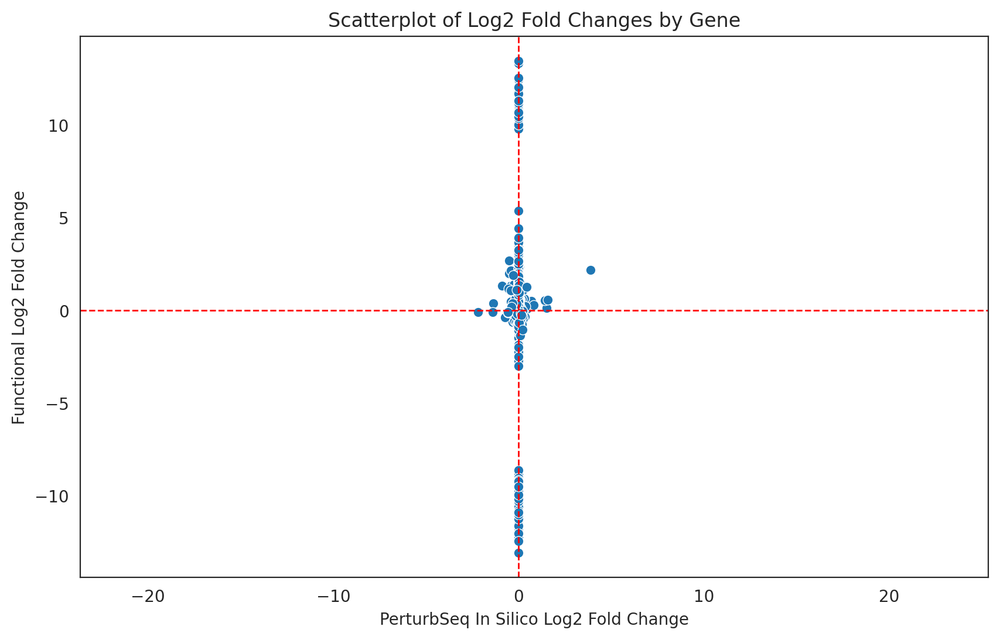

In [38]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_merged, x='Treatment_Log2_Fold_Change', y='Log2_Fold_Change')

"""
for i in range(1, len(result)):
    x_val = result['Control_Log2_Fold_Change'][i]
    y_val = result['logFC'][i]
    if abs(x_val) > 1 or abs(y_val) > 1:
        plt.text(
            x_val, 
            y_val, 
            result['Gene'][i],
            fontsize=9,
            ha='right'  # horizontal alignment
        )
"""

# Add labels and title
plt.xlabel('PerturbSeq In Silico Log2 Fold Change')
plt.ylabel('Functional Log2 Fold Change')
plt.xticks()
plt.yticks()
plt.title('Scatterplot of Log2 Fold Changes by Gene')

plt.axvline(x=0, color='red', linestyle='--', linewidth=1)
plt.axhline(y=0, color='red', linestyle='--', linewidth=1)
plt.axis('equal')


# Display the plot
plt.savefig("jinlab/perturb_fnc_scatter.jpg")

In [17]:
# Check if 'tbr1' exists in the 'gene' column
if 'Tbr1' in fold_change_df3['Gene'].values:
    print("tbr1 is present in the 'gene' column.")
else:
    print("tbr1 is not present in the 'gene' column.")

tbr1 is present in the 'gene' column.


In [ ]:
control = ['NonTarget1', 'NonTarget2', 'SafeTarget', 'GFP']
ctrl_adata = adata[adata.obs['assignDS'].isin(control)].copy()
# Only consider genes with more than 1 count
sc.pp.filter_genes(ctrl_adata, min_counts=1)
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(ctrl_adata, key_n_counts='nCount_RNA')
ctrl_adata = ctrl_adata[:, deg_list]
# Renormalize after filtering
sc.pp.normalize_per_cell(ctrl_adata)
ctrl_adata.raw = ctrl_adata
ctrl_adata.layers["raw_count"] = ctrl_adata.raw.X.copy()
# Log transformation and scaling
sc.pp.log1p(ctrl_adata)
sc.pp.scale(ctrl_adata)
print(f"Cell number is :{ctrl_adata.shape[0]}")
print(f"Gene number is :{ctrl_adata.shape[1]}")

# Load TF info which was made from mouse cell atlas dataset.
base_GRN = co.data.load_mouse_scATAC_atlas_base_GRN()

# Instantiate Oracle object
ctrl_oracle = co.Oracle()

# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
ctrl_adata.X = ctrl_adata.layers["raw_count"].copy()

# Instantiate Oracle object.
ctrl_oracle.import_anndata_as_raw_count(adata=ctrl_adata,
                                   cluster_column_name="predicted.subclass",
                                   embedding_name="X_umap")

# You can load TF info dataframe with the following code.
ctrl_oracle.import_TF_data(TF_info_matrix=base_GRN)

# Perform PCA
ctrl_oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(ctrl_oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)

n_cell = ctrl_oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")

ctrl_oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

# Save oracle object.
ctrl_oracle.to_hdf5("jinlab/ctxobj.ctrl.subclass.DEG.celloracle.oracle")

ctrl_links = ctrl_oracle.get_links(cluster_name_for_GRN_unit="predicted.subclass", alpha=10,
                         verbose_level=10)

ctrl_links.to_hdf5(file_path="jinlab/links.ctrl.subclass.DEG.celloracle.links")

In [2]:
# Download dataset. You can change the code blow to use your data.
adata = co.data_conversion.seurat_object_to_anndata("/gpfs/home/asun/jinlab/ctxobj.rds",
                                                    delete_tmp_file=True)

raw_count_layer = adata['RNA'].layers['raw_count']
adata['RNA'].X = raw_count_layer
adata = adata['RNA']

input file name: /gpfs/home/asun/jinlab/ctxobj.rds


Loading required package: SeuratObject
Loading required package: sp

Attaching package: ‘SeuratObject’

The following objects are masked from ‘package:base’:

    intersect, t

loading seurat object ...
  seurat object version is 4x
Processing an assay: RNA
Processing an assay: Crispr


making AnnData ...
2 assays found in the seurat object.
Data is exported as multiple files.
If the seurat object was made by integrating multiple files, please be careful about 'Simpson's effect' in the inferred GRN.
Go to CellOracle web documentation for detailed information about this issue.


In [19]:
test_adata = ad.read_h5ad("jinlab/ctxobj.h5ad")

In [20]:
test_adata

AnnData object with n_obs × n_vars = 11471 × 2000
    obs: 'Name', 'RNA_snn_res.0.8', '_index', 'bcds', 'cxds', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'scds'

In [22]:
adata[

AnnData object with n_obs × n_vars = 11471 × 32285
    obs: 'Name', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scds', 'cxds', 'bcds', 'RNA_snn_res.0.8', 'seurat_clusters', 'nCount_refAssay', 'nFeature_refAssay', 'predicted.subclass.score', 'predicted.subclass', 'feature_call', 'num_features', 'num_umis', 'nCount_Crispr', 'nFeature_Crispr', 'RNA_snn_res.1.5', 'lowQC', 'CellType', 'Perc', 'CBC', 'antisense', 'intergenic', 'intronic', 'exonic', 'multi', 'unmapped', 'highConf', 'polyA', 'TSO', 'spliced', 'percent_qual_cbc', 'percent_qual_umi', 'nUMI', 'UTR', 'total', 'Rem', 'CellType_Gen', 'Mito', 'demux_type', 'assignment', 'Keep', 'Max', 'MaxVal', 'SecMaxVal', 'demuxHC', 'demuxCR', 'demuxDS', 'assignDS', 'pertgene', 'active_ident'
    var: 'variable_gene'
    uns: 'RNA_snn_res.0.8_colors', 'seurat_clusters_colors', 'active_ident_colors'
    obsm: 'X_umap', 'X_pca', 'X_gbm'
    layers: 'raw_count'

In [23]:
del adata.obs['RNA_snn_res.0.8']


In [16]:
adata.obs["active_ident"]

Ch1_AAACCTGTCAGGTTCA-1    6
Ch1_AAACCTGTCCTTTACA-1    4
Ch1_AAACGGGCACAGGAGT-1    1
Ch1_AAACGGGCATGCAATC-1    6
Ch1_AAACGGGGTAATAGCA-1    5
                         ..
Ch5_TTTGGTTGTTCACGGC-1    2
Ch5_TTTGGTTTCGAACGGA-1    0
Ch5_TTTGGTTTCTTTACGT-1    6
Ch5_TTTGTCAGTTGACGTT-1    1
Ch5_TTTGTCATCTACTTAC-1    4
Name: active_ident, Length: 11471, dtype: object

In [17]:
adata.obs["active_ident"] = pd.Categorical(adata.obs["active_ident"])

In [18]:
adata.write("/gpfs/home/asun/jinlab/ctxobj.h5ad")


In [27]:
goi = "Tbr1"
goi_targets = [f"{goi}_1", f"{goi}_2", f"{goi}_2"]
goi_targets

['Tbr1_1', 'Tbr1_2', 'Tbr1_2']